# Machine learning - 3rd practice project

#### Student Grades Prediction Project 

-- Project Description

The dataset contains grades scored by students throughout their university tenure in various courses and their CGPA calculated based on their grades..

-- Features Description

Seat No : The enrolled number of candidate that took the exams

CGPA : The cumulative GPA based on the four year total grade progress of each candidate . CGPA is a Final Marks -- provided to student.
 
All other columns are course codes in the format AB-XXX where AB are alphabets representing candidates' departments and XXX are numbers where first X represents the year the canditate took exam.

-- Predict - CGPA of a student based on different grades in four years..

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [165]:
grades = pd.read_csv("C:/Users/user/Downloads/Grades.csv")
grades

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,CS-97567,B,A,A,A-,A+,A,A-,A-,A+,...,A-,A-,A,A,A,B+,B+,B,A,3.798
567,CS-97568,A+,A,A,A,A,A,A,A-,A,...,B+,B+,A,A,A-,B,A-,C,A-,3.772
568,CS-97569,B,A,A-,B+,A,A,A,A,A,...,A-,B,A,B+,A,C,B+,A-,A-,3.470
569,CS-97570,A,B+,D,A,D,D+,B-,C-,B-,...,D,B,B,C-,D,C,B,B-,C,2.193


In [166]:
grades.shape

(571, 43)

In [4]:
grades.head()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448


In [5]:
grades.tail()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
566,CS-97567,B,A,A,A-,A+,A,A-,A-,A+,...,A-,A-,A,A,A,B+,B+,B,A,3.798
567,CS-97568,A+,A,A,A,A,A,A,A-,A,...,B+,B+,A,A,A-,B,A-,C,A-,3.772
568,CS-97569,B,A,A-,B+,A,A,A,A,A,...,A-,B,A,B+,A,C,B+,A-,A-,3.470
569,CS-97570,A,B+,D,A,D,D+,B-,C-,B-,...,D,B,B,C-,D,C,B,B-,C,2.193
570,CS-97571,C,D,D,C,C,D+,B,C+,C,...,C+,C,B-,D,F,C-,B+,D,C-,1.753


In [6]:
#Checking for null values
grades.isnull().sum()

Seat No.      0
PH-121        0
HS-101        0
CY-105        1
HS-105/12     1
MT-111        2
CS-105        0
CS-106        2
EL-102        2
EE-119        2
ME-107        2
CS-107        2
HS-205/20     5
MT-222        5
EE-222        7
MT-224        7
CS-210        7
CS-211        5
CS-203        5
CS-214        6
EE-217        6
CS-212        6
CS-215        6
MT-331        9
EF-303       10
HS-304       10
CS-301       10
CS-302       10
TC-383       10
MT-442       10
EL-332        9
CS-318        9
CS-306        9
CS-312       10
CS-317       12
CS-403       12
CS-421       12
CS-406       85
CS-414       13
CS-419       13
CS-423       14
CS-412       79
CGPA          0
dtype: int64

-- As we can see there are a lot of null values present..we need to get rid of them..

<Axes: >

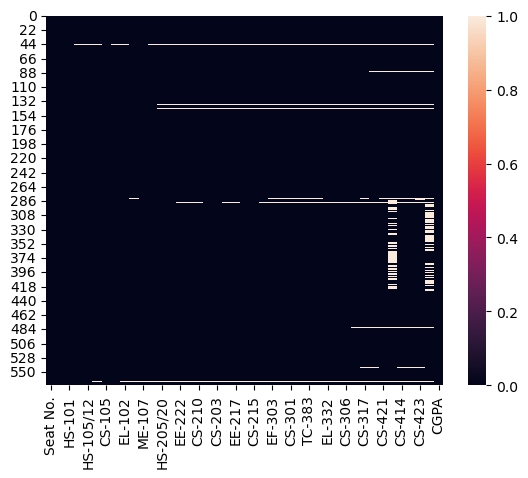

In [8]:
#Visually checking for null values
sns.heatmap(grades.isnull())

In [12]:
grades.columns

Index(['Seat No.', 'PH-121', 'HS-101', 'CY-105', 'HS-105/12', 'MT-111',
       'CS-105', 'CS-106', 'EL-102', 'EE-119', 'ME-107', 'CS-107', 'HS-205/20',
       'MT-222', 'EE-222', 'MT-224', 'CS-210', 'CS-211', 'CS-203', 'CS-214',
       'EE-217', 'CS-212', 'CS-215', 'MT-331', 'EF-303', 'HS-304', 'CS-301',
       'CS-302', 'TC-383', 'MT-442', 'EL-332', 'CS-318', 'CS-306', 'CS-312',
       'CS-317', 'CS-403', 'CS-421', 'CS-406', 'CS-414', 'CS-419', 'CS-423',
       'CS-412', 'CGPA'],
      dtype='object')

In [13]:
#Checking for Duplicates
grades.duplicated().sum()

0

No duplicate values present in the dataset..

In [14]:
#Checking for dataset info
grades.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 571 entries, 0 to 570
Data columns (total 43 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Seat No.   571 non-null    object 
 1   PH-121     571 non-null    object 
 2   HS-101     571 non-null    object 
 3   CY-105     570 non-null    object 
 4   HS-105/12  570 non-null    object 
 5   MT-111     569 non-null    object 
 6   CS-105     571 non-null    object 
 7   CS-106     569 non-null    object 
 8   EL-102     569 non-null    object 
 9   EE-119     569 non-null    object 
 10  ME-107     569 non-null    object 
 11  CS-107     569 non-null    object 
 12  HS-205/20  566 non-null    object 
 13  MT-222     566 non-null    object 
 14  EE-222     564 non-null    object 
 15  MT-224     564 non-null    object 
 16  CS-210     564 non-null    object 
 17  CS-211     566 non-null    object 
 18  CS-203     566 non-null    object 
 19  CS-214     565 non-null    object 
 20  EE-217    

-- As the features 'CS-406' and 'CS-412' combined have a lot a null values..we are going to drop these respective columns and then treat the other values..

In [167]:
grades.drop('CS-406', axis=1, inplace = True)

In [168]:
grades.drop('CS-412', axis=1, inplace = True)

In [169]:
grades.shape

(571, 41)

In [150]:
grades.isnull().sum()

Seat No.      0
PH-121        0
HS-101        0
CY-105        1
HS-105/12     1
MT-111        2
CS-105        0
CS-106        2
EL-102        2
EE-119        2
ME-107        2
CS-107        2
HS-205/20     5
MT-222        5
EE-222        7
MT-224        7
CS-210        7
CS-211        5
CS-203        5
CS-214        6
EE-217        6
CS-212        6
CS-215        6
MT-331        9
EF-303       10
HS-304       10
CS-301       10
CS-302       10
TC-383       10
MT-442       10
EL-332        9
CS-318        9
CS-306        9
CS-312       10
CS-317       12
CS-403       12
CS-421       12
CS-414       13
CS-419       13
CS-423       14
CGPA          0
dtype: int64

In [170]:
#Treating null values by filling the null values by mode..
grades['CS-423'] = grades['CS-423'].fillna(grades['CS-423'].mode().iat[0])

In [171]:
#Treating null values for CS subject
grades['CS-419'] = grades['CS-419'].fillna(grades['CS-419'].mode().iat[0])
grades['CS-414'] = grades['CS-414'].fillna(grades['CS-414'].mode().iat[0])
grades['CS-421'] = grades['CS-421'].fillna(grades['CS-421'].mode().iat[0])
grades['CS-403'] = grades['CS-403'].fillna(grades['CS-403'].mode().iat[0])
grades['CS-317'] = grades['CS-317'].fillna(grades['CS-317'].mode().iat[0])
grades['CS-312'] = grades['CS-312'].fillna(grades['CS-312'].mode().iat[0])
grades['CS-306'] = grades['CS-306'].fillna(grades['CS-306'].mode().iat[0])
grades['CS-318'] = grades['CS-318'].fillna(grades['CS-318'].mode().iat[0])
grades['CS-302'] = grades['CS-302'].fillna(grades['CS-302'].mode().iat[0])
grades['CS-301'] = grades['CS-301'].fillna(grades['CS-301'].mode().iat[0])
grades['CS-214'] = grades['CS-214'].fillna(grades['CS-214'].mode().iat[0])
grades['CS-203'] = grades['CS-203'].fillna(grades['CS-203'].mode().iat[0])
grades['CS-211'] = grades['CS-211'].fillna(grades['CS-211'].mode().iat[0])
grades['CS-210'] = grades['CS-210'].fillna(grades['CS-210'].mode().iat[0])
grades['CS-106'] = grades['CS-106'].fillna(grades['CS-106'].mode().iat[0])
grades['CS-212'] = grades['CS-212'].fillna(grades['CS-212'].mode().iat[0])
grades['CS-215'] = grades['CS-215'].fillna(grades['CS-215'].mode().iat[0])

# Now we treat the columns with high null values and drop the ones with less number as it doesn't make much difference
grades['MT-442'] = grades['MT-442'].fillna(grades['MT-442'].mode().iat[0])
grades['TC-383'] = grades['TC-383'].fillna(grades['TC-383'].mode().iat[0])
grades['HS-304'] = grades['HS-304'].fillna(grades['HS-304'].mode().iat[0])
grades['EF-303'] = grades['EF-303'].fillna(grades['EF-303'].mode().iat[0])
grades['MT-331'] = grades['MT-331'].fillna(grades['MT-331'].mode().iat[0])
grades['EL-332'] = grades['EL-332'].fillna(grades['EL-332'].mode().iat[0])

In [172]:
grades.isnull().sum()

Seat No.     0
PH-121       0
HS-101       0
CY-105       1
HS-105/12    1
MT-111       2
CS-105       0
CS-106       0
EL-102       2
EE-119       2
ME-107       2
CS-107       2
HS-205/20    5
MT-222       5
EE-222       7
MT-224       7
CS-210       0
CS-211       0
CS-203       0
CS-214       0
EE-217       6
CS-212       0
CS-215       0
MT-331       0
EF-303       0
HS-304       0
CS-301       0
CS-302       0
TC-383       0
MT-442       0
EL-332       0
CS-318       0
CS-306       0
CS-312       0
CS-317       0
CS-403       0
CS-421       0
CS-414       0
CS-419       0
CS-423       0
CGPA         0
dtype: int64

In [173]:
#Dropping rows of null values with less number
grades = grades.dropna(how = 'any', axis= 0)
grades

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-318,CS-306,CS-312,CS-317,CS-403,CS-421,CS-414,CS-419,CS-423,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C,C-,C-,C-,C-,A,C-,B,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,A-,D,D+,D,C,D,B-,C,C,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,A-,A-,B,B,A,C,A,A,A-,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,B+,C-,D+,C,D+,C-,B,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,A-,B-,B+,B+,B-,A,A-,A-,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,CS-97567,B,A,A,A-,A+,A,A-,A-,A+,...,A,B+,A-,A-,A,A,B+,B+,B,3.798
567,CS-97568,A+,A,A,A,A,A,A,A-,A,...,A+,A-,B+,B+,A,A,B,A-,C,3.772
568,CS-97569,B,A,A-,B+,A,A,A,A,A,...,C+,B+,A-,B,A,B+,C,B+,A-,3.470
569,CS-97570,A,B+,D,A,D,D+,B-,C-,B-,...,B-,B+,D,B,B,C-,C,B,B-,2.193


In [174]:
grades.isnull().sum()

Seat No.     0
PH-121       0
HS-101       0
CY-105       0
HS-105/12    0
MT-111       0
CS-105       0
CS-106       0
EL-102       0
EE-119       0
ME-107       0
CS-107       0
HS-205/20    0
MT-222       0
EE-222       0
MT-224       0
CS-210       0
CS-211       0
CS-203       0
CS-214       0
EE-217       0
CS-212       0
CS-215       0
MT-331       0
EF-303       0
HS-304       0
CS-301       0
CS-302       0
TC-383       0
MT-442       0
EL-332       0
CS-318       0
CS-306       0
CS-312       0
CS-317       0
CS-403       0
CS-421       0
CS-414       0
CS-419       0
CS-423       0
CGPA         0
dtype: int64

<Axes: >

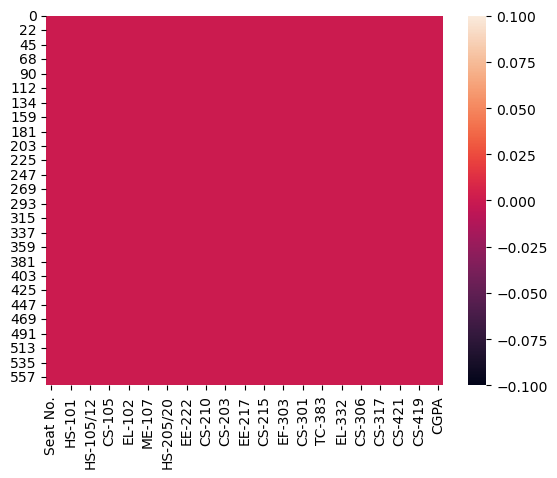

In [176]:
sns.heatmap(grades.isnull())

-- Therefore we see that we have successfully removed all the null values..

In [40]:
cat_col = []
num_col = []
for column in grades:
    if column == 'CGPA':
        num_col.append(column)
    elif column == 'Seat No.':
        num_col.append(column)
    else:
        cat_col.append(column)

In [41]:
num_col

['Seat No.', 'CGPA']

In [44]:
cat_col

['PH-121',
 'HS-101',
 'CY-105',
 'HS-105/12',
 'MT-111',
 'CS-105',
 'CS-106',
 'EL-102',
 'EE-119',
 'ME-107',
 'CS-107',
 'HS-205/20',
 'MT-222',
 'EE-222',
 'MT-224',
 'CS-210',
 'CS-211',
 'CS-203',
 'CS-214',
 'EE-217',
 'CS-212',
 'CS-215',
 'MT-331',
 'EF-303',
 'HS-304',
 'CS-301',
 'CS-302',
 'TC-383',
 'MT-442',
 'EL-332',
 'CS-318',
 'CS-306',
 'CS-312',
 'CS-317',
 'CS-403',
 'CS-421',
 'CS-414',
 'CS-419',
 'CS-423']

In [175]:
#Finding uniques variables in each feature and categorising them
for i in cat_col:
    print(f"Categories in {i} variable: ",end="\n")
    print(grades[i].unique())

Categories in PH-121 variable: 
['B-' 'A' 'D' 'A-' 'B+' 'B' 'C+' 'C' 'C-' 'D+' 'WU' 'A+']
Categories in HS-101 variable: 
['D+' 'D' 'B' 'C+' 'A-' 'B-' 'C-' 'B+' 'C' 'A' 'A+']
Categories in CY-105 variable: 
['C-' 'D+' 'A' 'A-' 'B' 'C+' 'B+' 'B-' 'C' 'D' 'A+' 'F']
Categories in HS-105/12 variable: 
['C' 'D' 'B-' 'B+' 'D+' 'B' 'C-' 'C+' 'A-' 'A' 'A+' 'F']
Categories in MT-111 variable: 
['C-' 'B-' 'B+' 'D' 'A' 'C+' 'A-' 'C' 'B' 'D+' 'A+' 'F' 'WU']
Categories in CS-105 variable: 
['D+' 'C' 'A' 'A-' 'B' 'B-' 'B+' 'C+' 'C-' 'A+' 'D']
Categories in CS-106 variable: 
['D' 'B-' 'D+' 'A-' 'C+' 'A' 'C-' 'C' 'B' 'B+' 'A+']
Categories in EL-102 variable: 
['C-' 'A' 'B+' 'B' 'A-' 'B-' 'C' 'C+' 'D+' 'D' 'A+']
Categories in EE-119 variable: 
['B-' 'D+' 'A-' 'D' 'A' 'B+' 'B' 'C-' 'C+' 'C' 'WU' 'A+']
Categories in ME-107 variable: 
['C-' 'D' 'A-' 'C+' 'B+' 'A' 'D+' 'C' 'B' 'B-' 'F' 'A+']
Categories in CS-107 variable: 
['C-' 'B+' 'B-' 'D' 'C' 'A-' 'C+' 'D+' 'B' 'A' 'A+']
Categories in HS-205/20 variabl

In [177]:
#Checking the number of unique values of each column
grades.nunique()

Seat No.     563
PH-121        12
HS-101        11
CY-105        12
HS-105/12     12
MT-111        13
CS-105        11
CS-106        11
EL-102        11
EE-119        12
ME-107        12
CS-107        11
HS-205/20     12
MT-222        12
EE-222        13
MT-224        14
CS-210        14
CS-211        12
CS-203        12
CS-214        12
EE-217        12
CS-212        12
CS-215        13
MT-331        12
EF-303        12
HS-304        14
CS-301        12
CS-302        11
TC-383        12
MT-442        12
EL-332        13
CS-318        14
CS-306        13
CS-312        14
CS-317        12
CS-403        11
CS-421        13
CS-414        13
CS-419        12
CS-423        12
CGPA         484
dtype: int64

In [183]:
#dropping the Seat No. column as it does not provide enough information for prediction
grades.drop('Seat No.', axis=1, inplace = True)

## Univariate Analysis 

In [182]:
grades.describe()

,CGPA
count,563.000000
mean,2.971314
std,0.602162
min,1.092000
25%,2.558000
50%,3.037000
75%,3.455000
max,3.985000


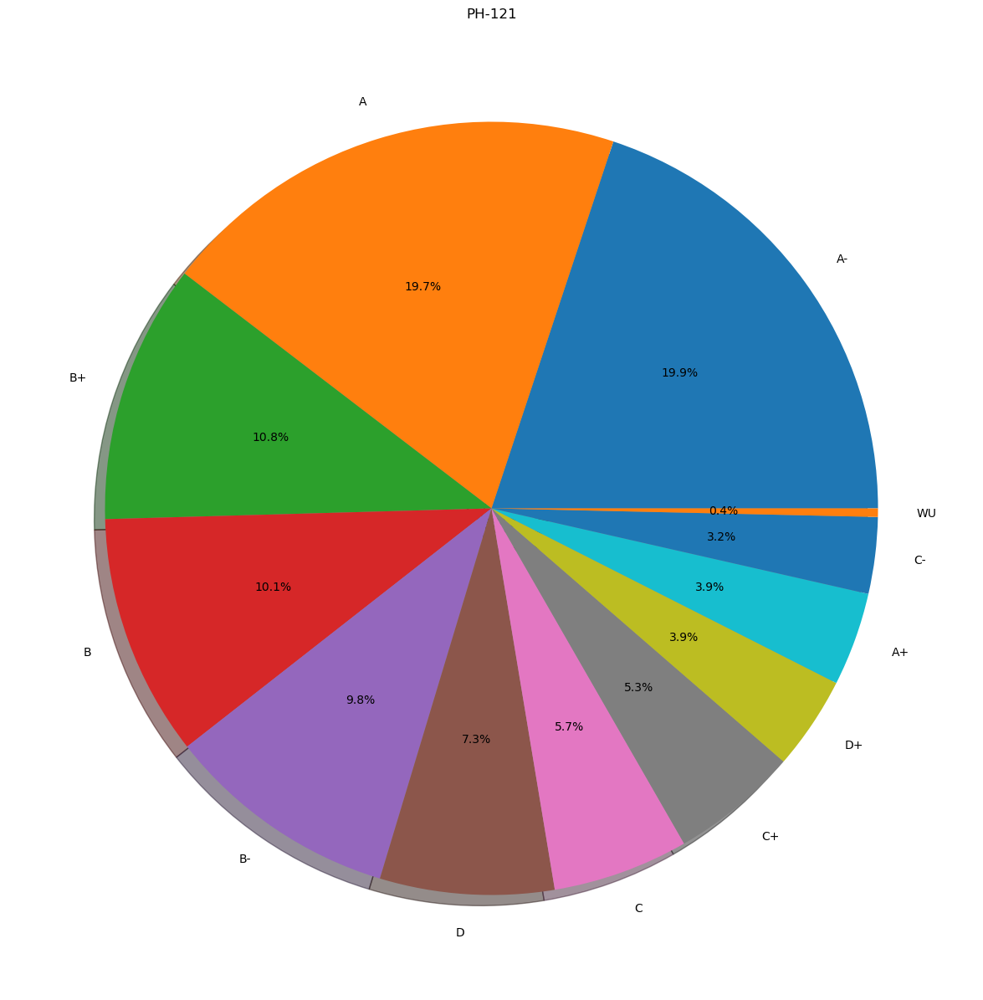

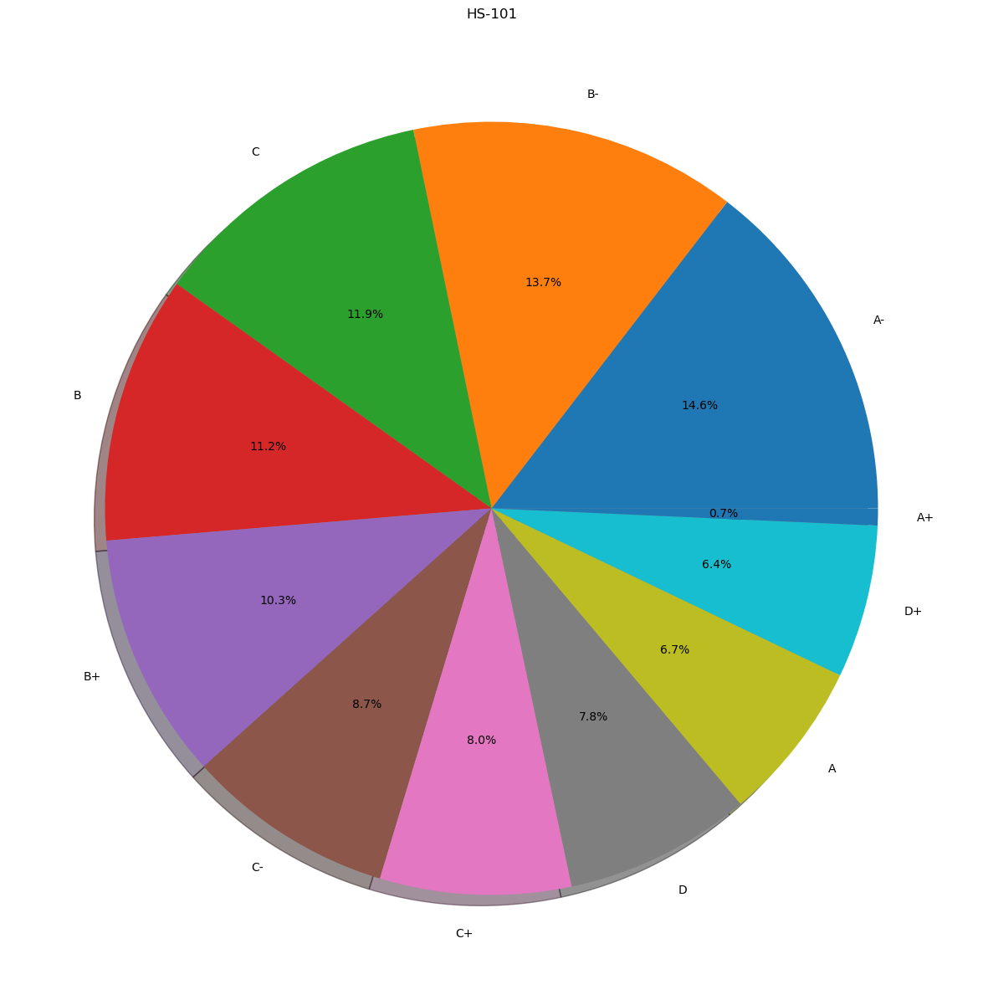

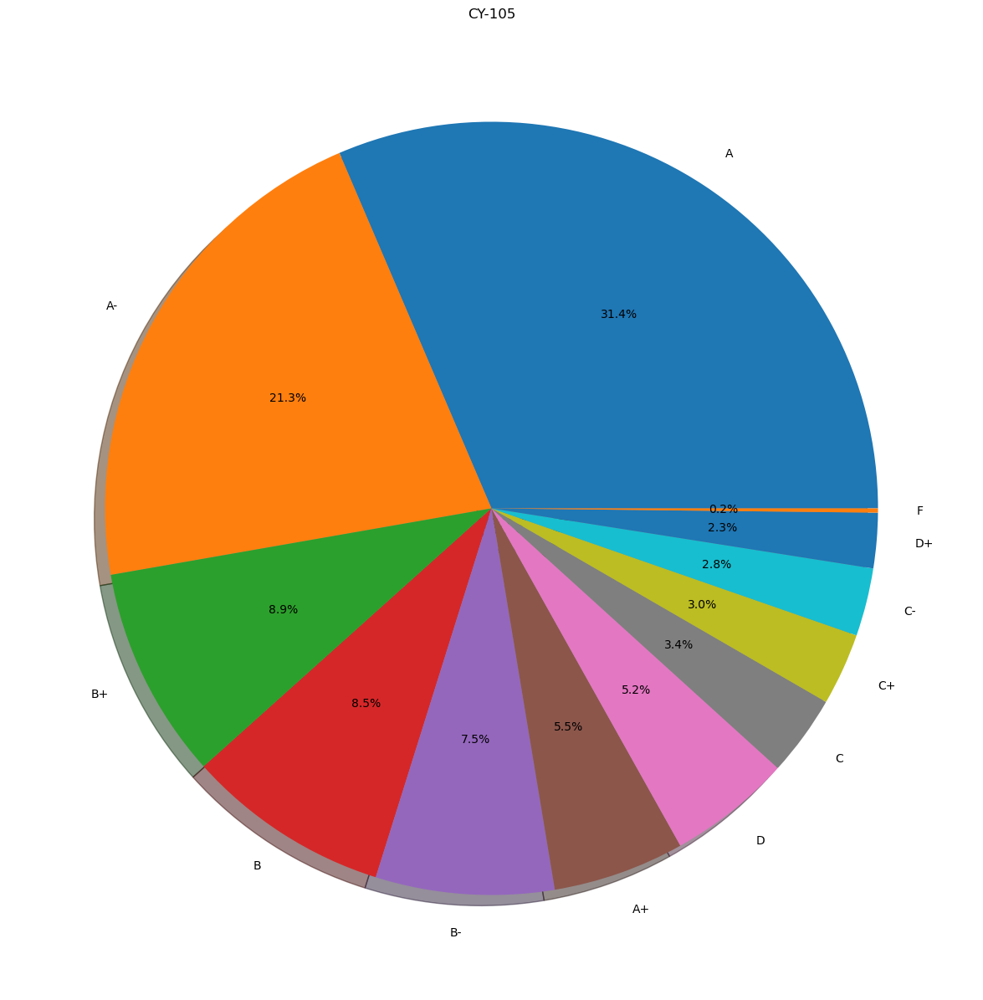

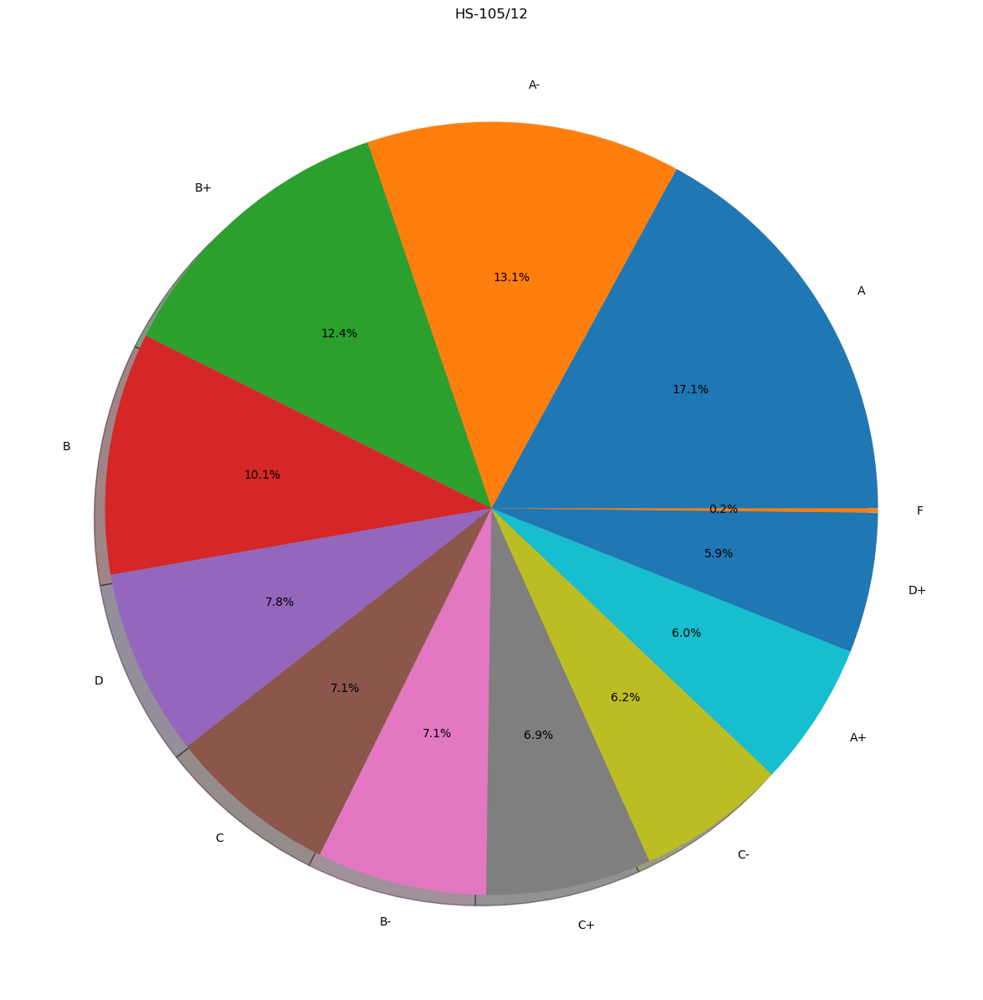

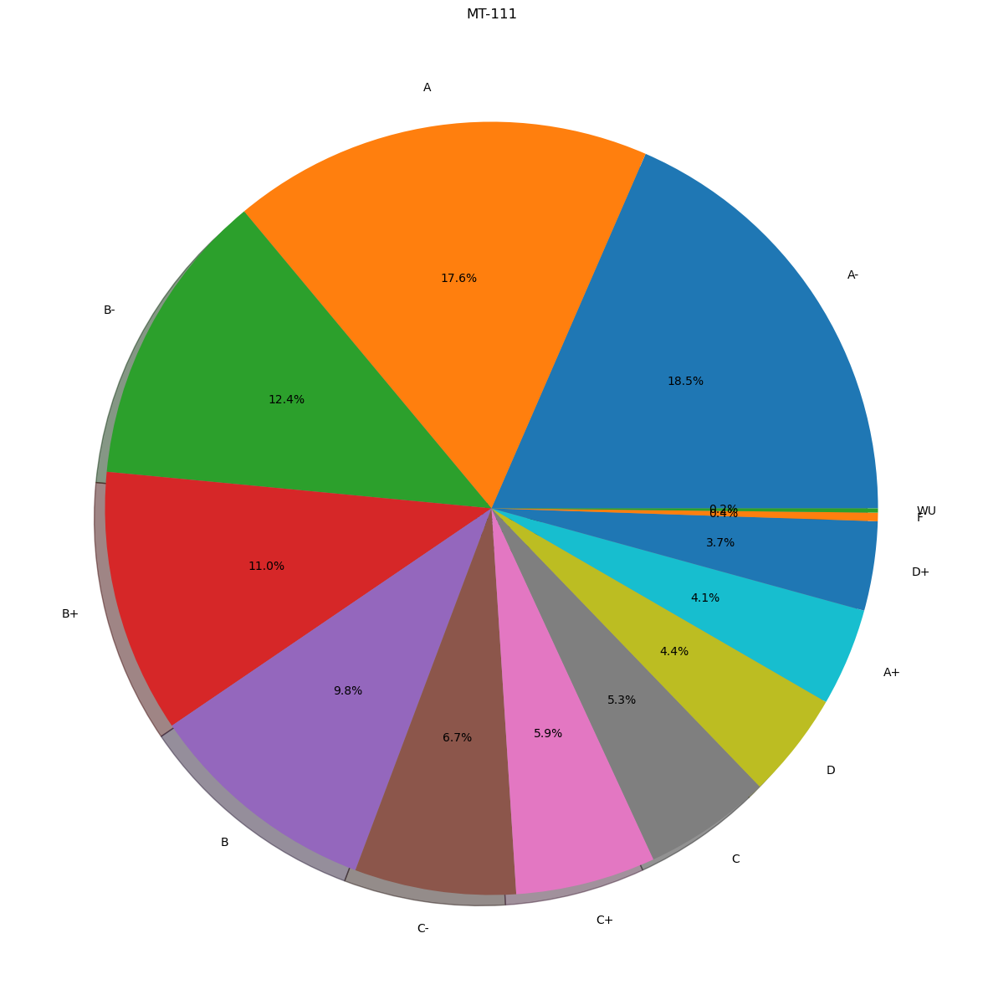

...

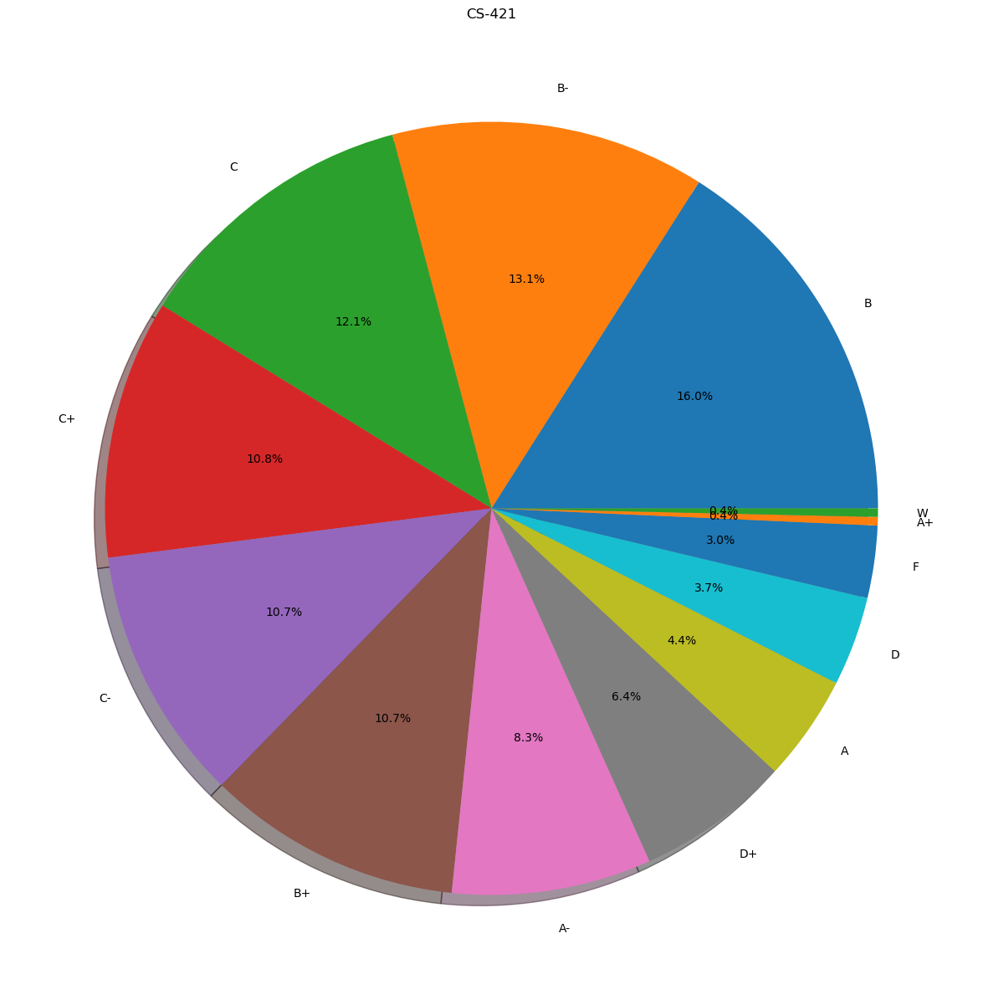

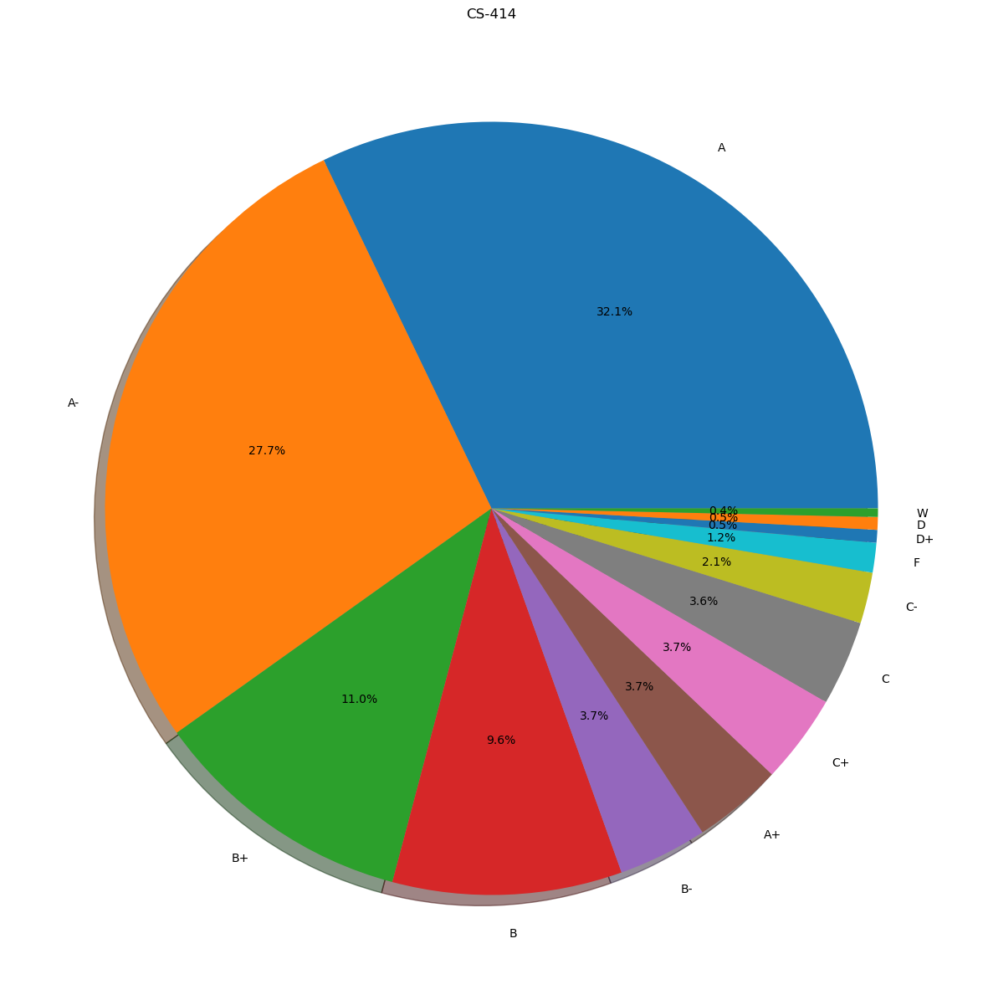

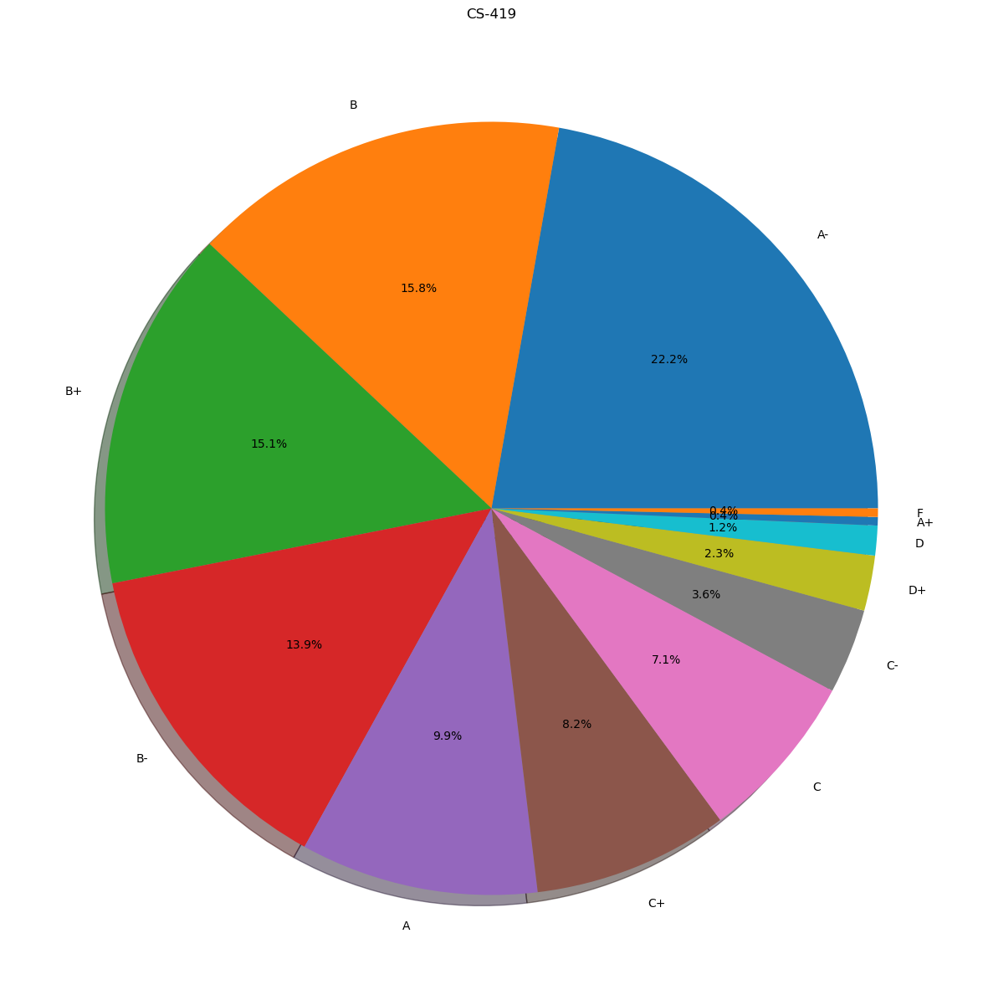

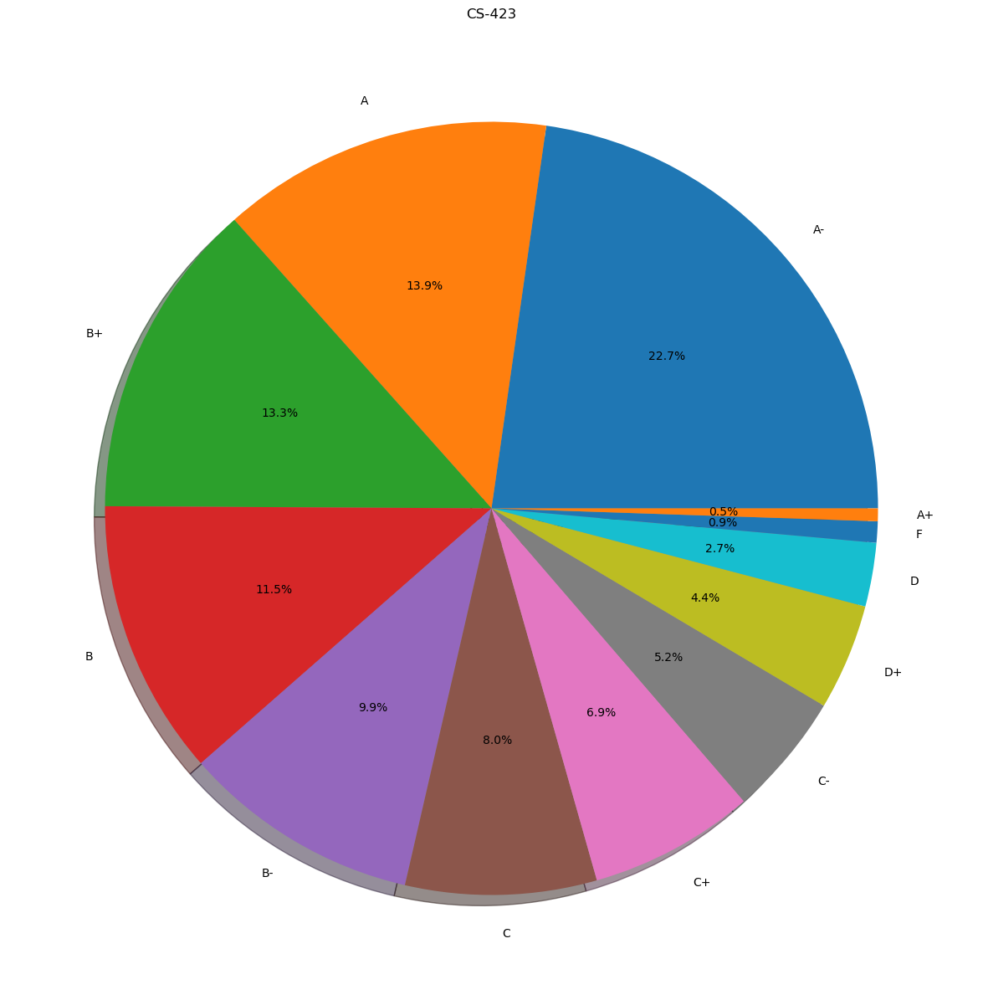

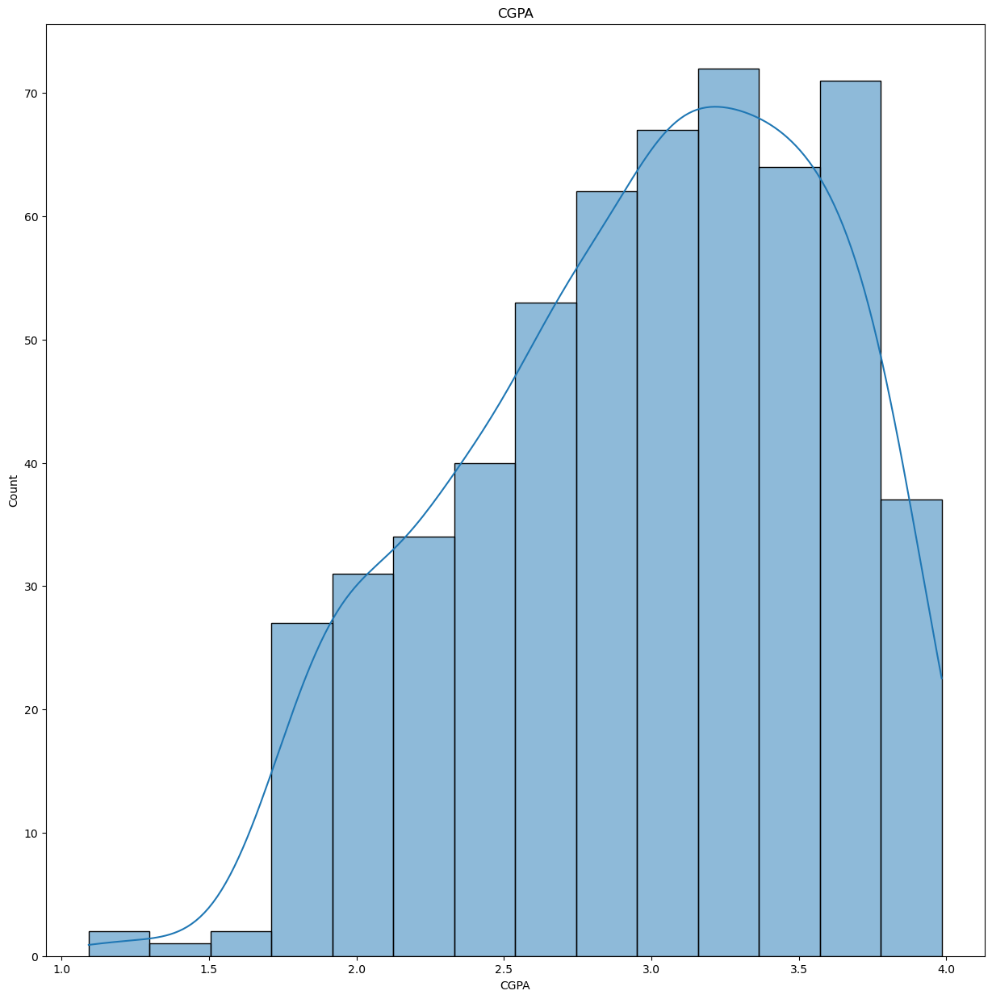

In [184]:
hist_bar_plot = []
for column in grades:
    plt.figure(column, figsize = (15,15))
    plt.title(column)
    if grades[column].dtypes != "object":
        sns.histplot(x = column,data = grades,kde=True)
        hist_bar_plot.append(column)
    elif grades[column].dtypes == "object":
        sizes = grades[column].value_counts()
        plt.pie(sizes.values,labels=sizes.index,autopct = '%1.1f%%',shadow=True)
        hist_bar_plot.append(column)

## Bivariate Analysis 

-- Now we shall see how the variables(features) are related to each other and what can we derive from them..

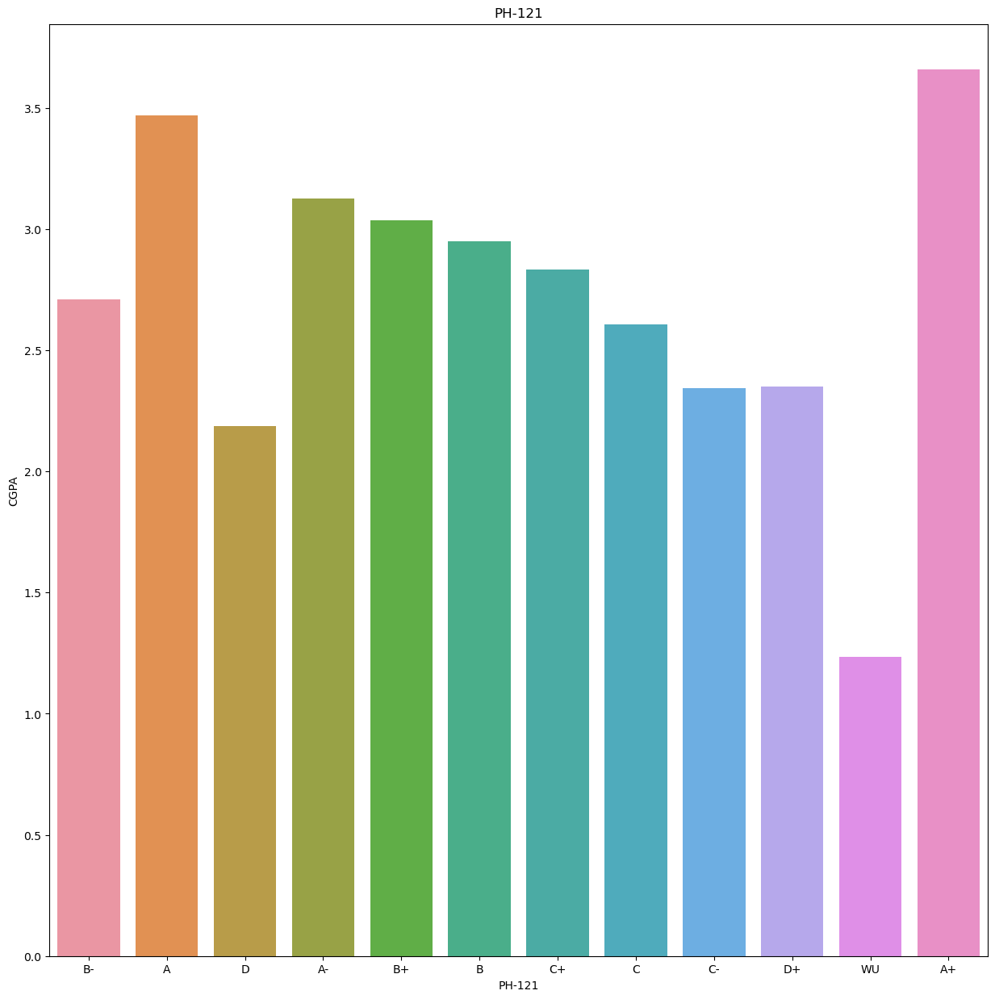

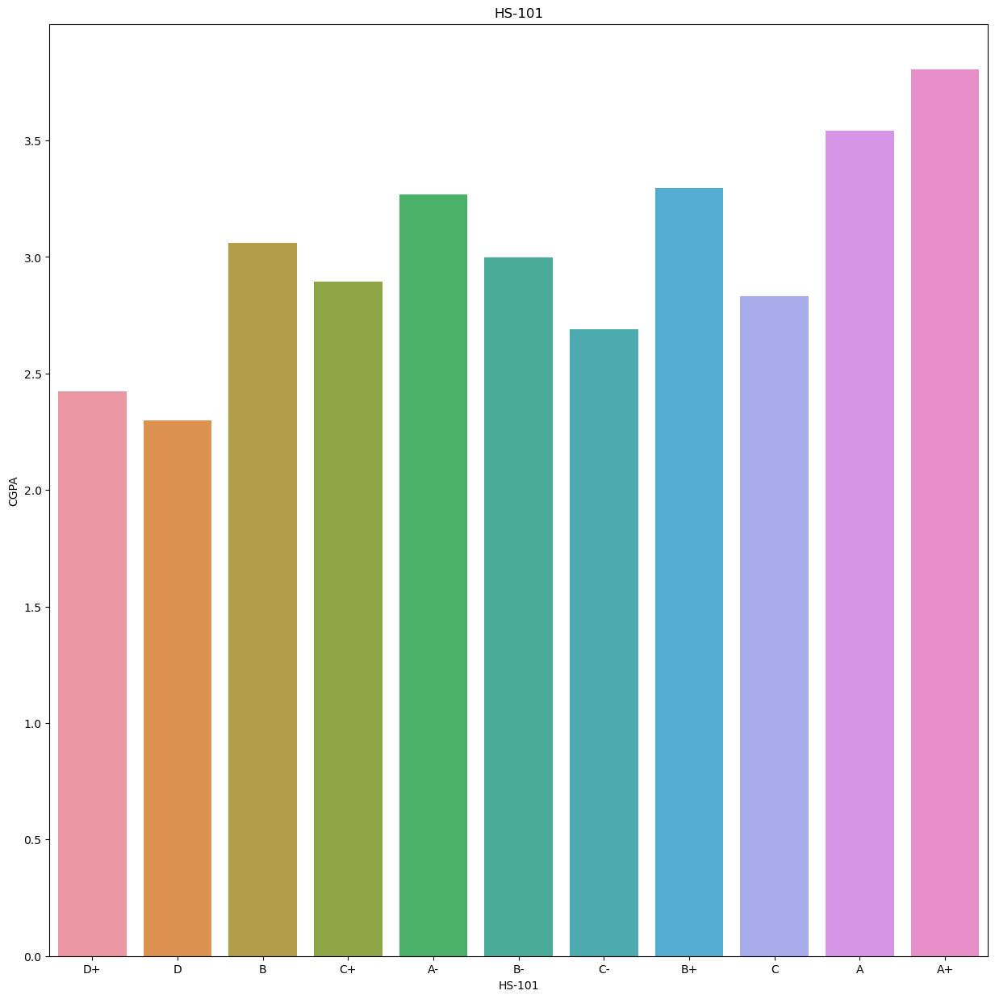

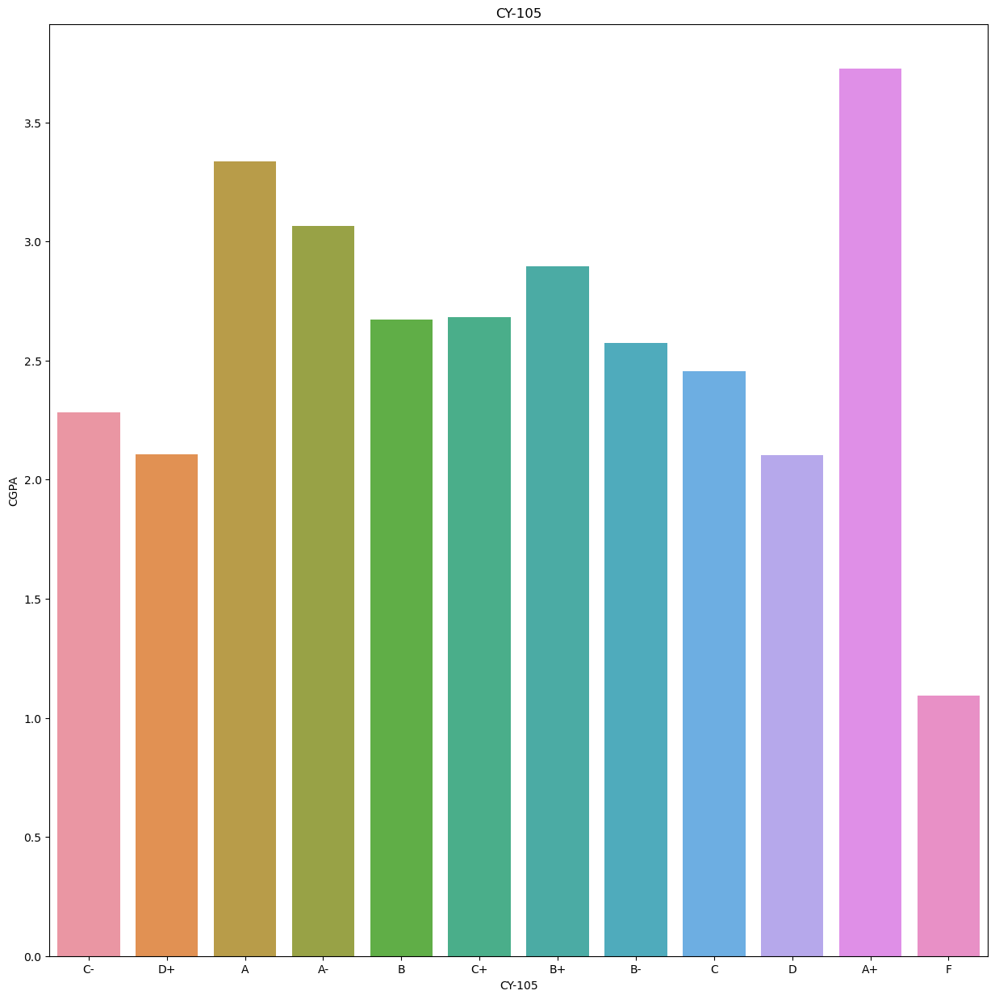

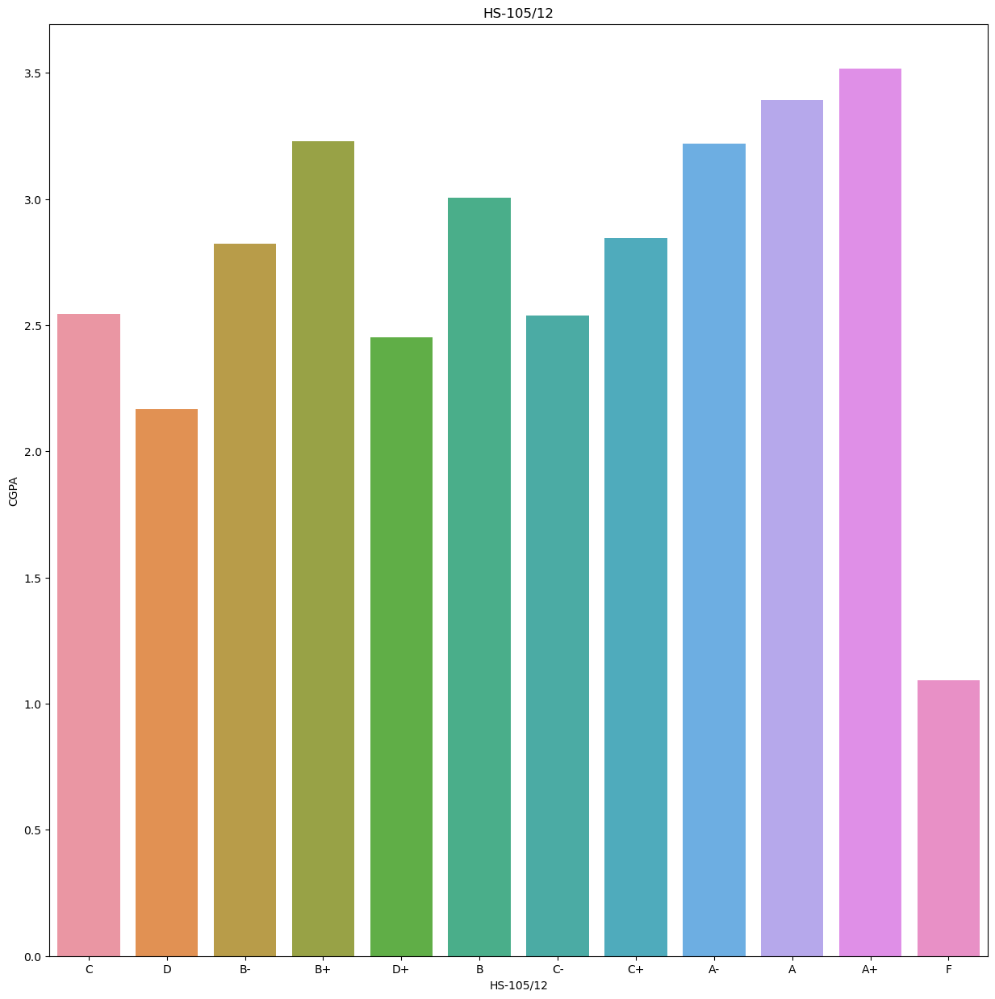

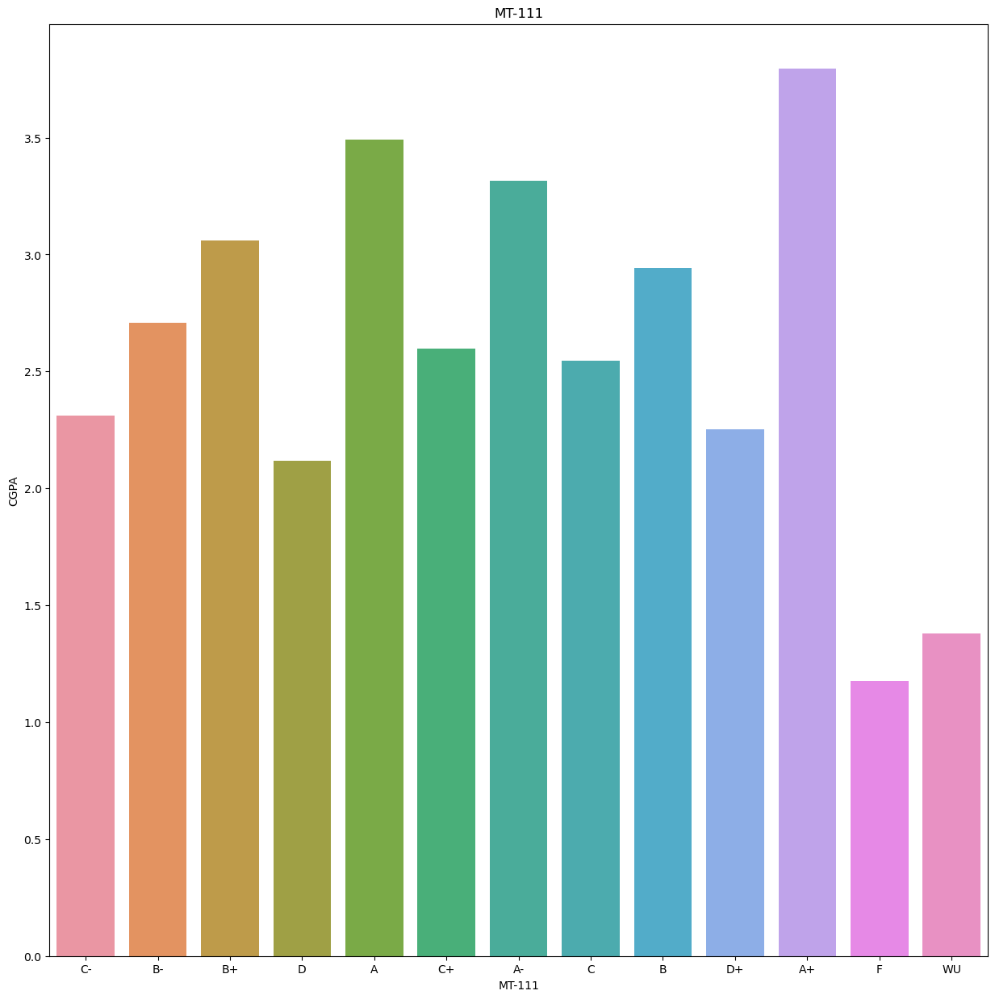

...

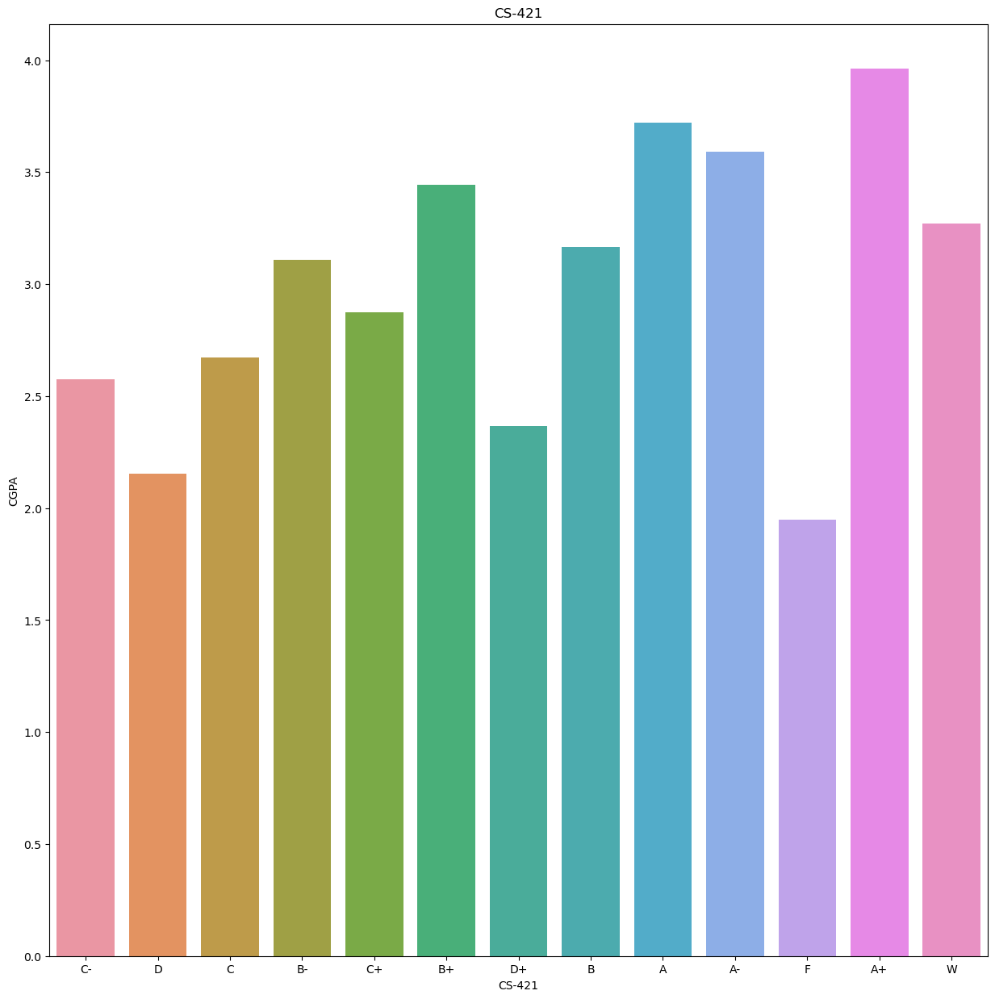

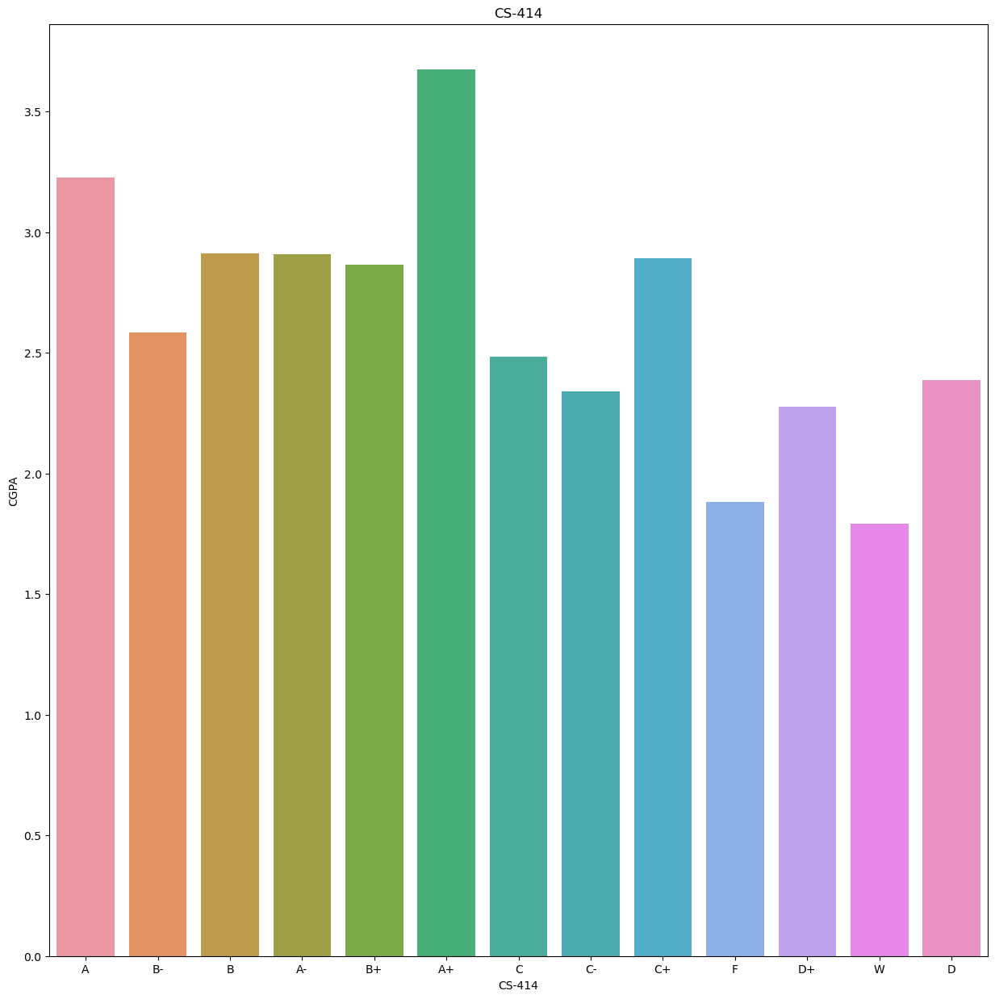

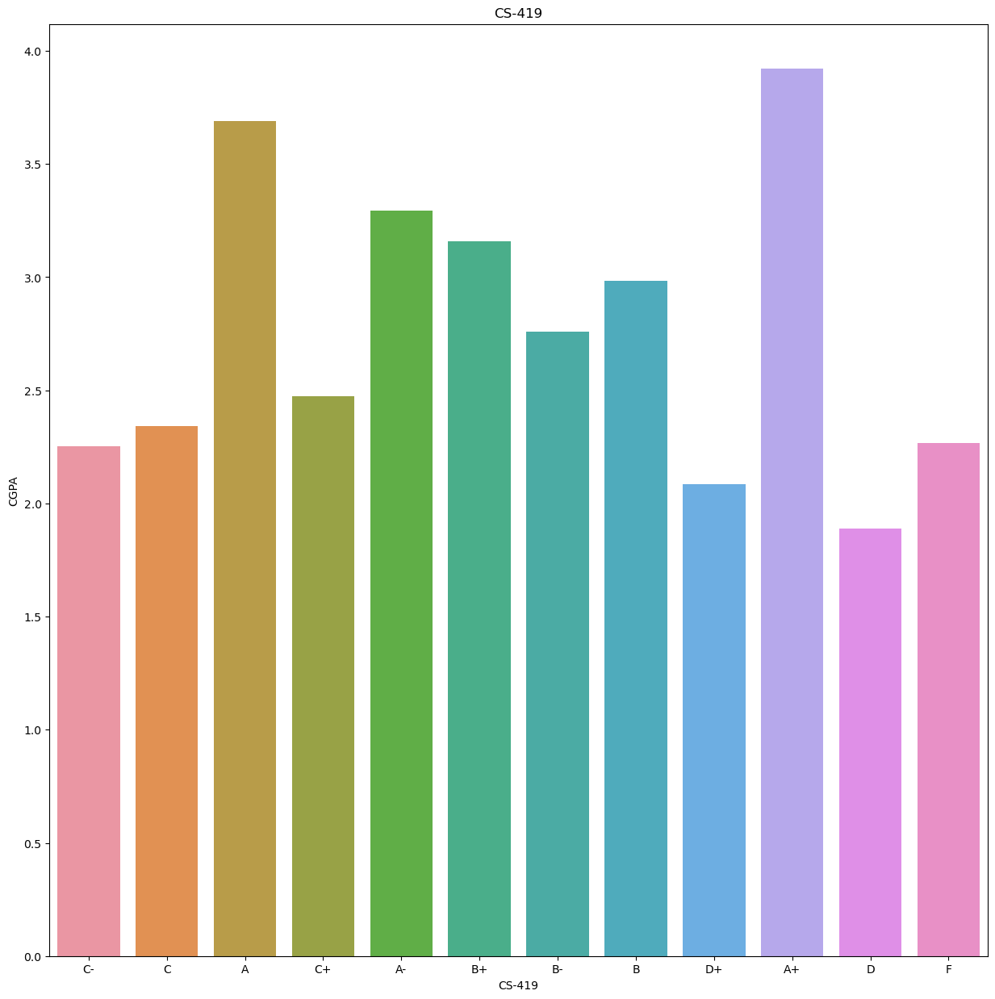

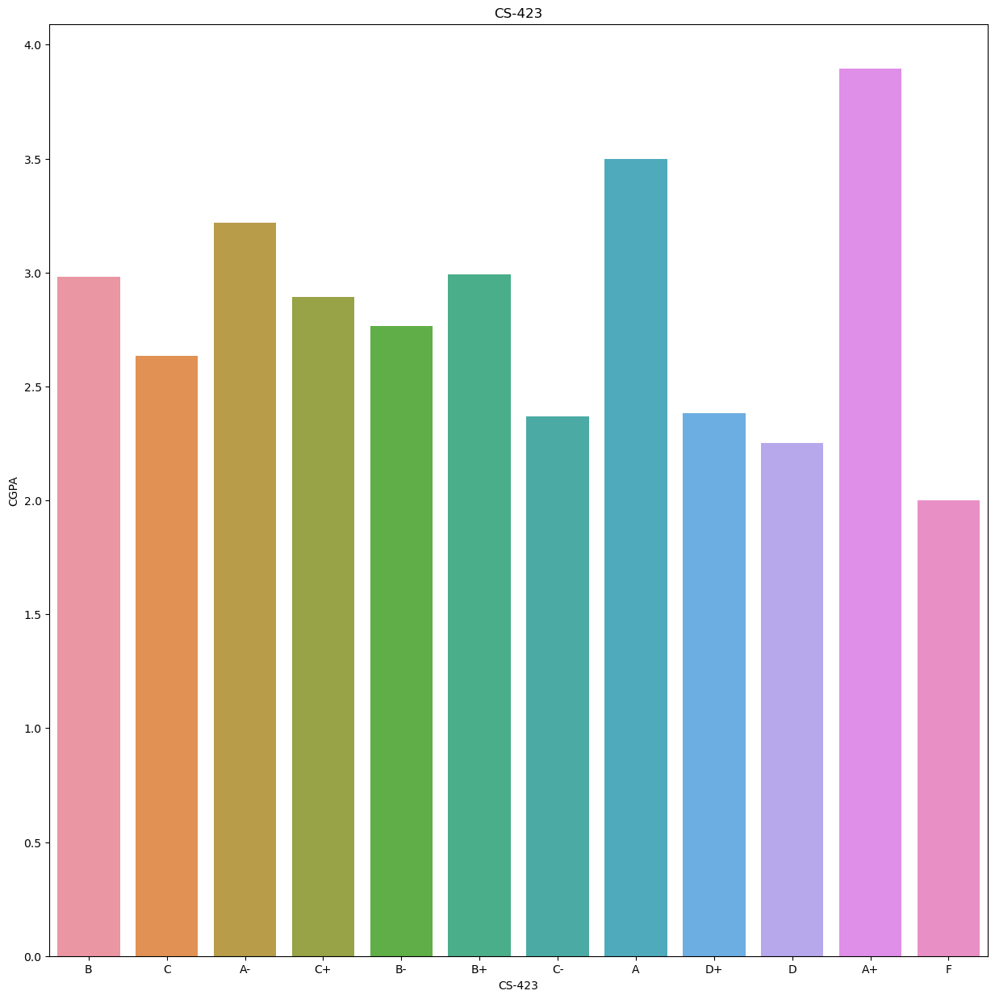

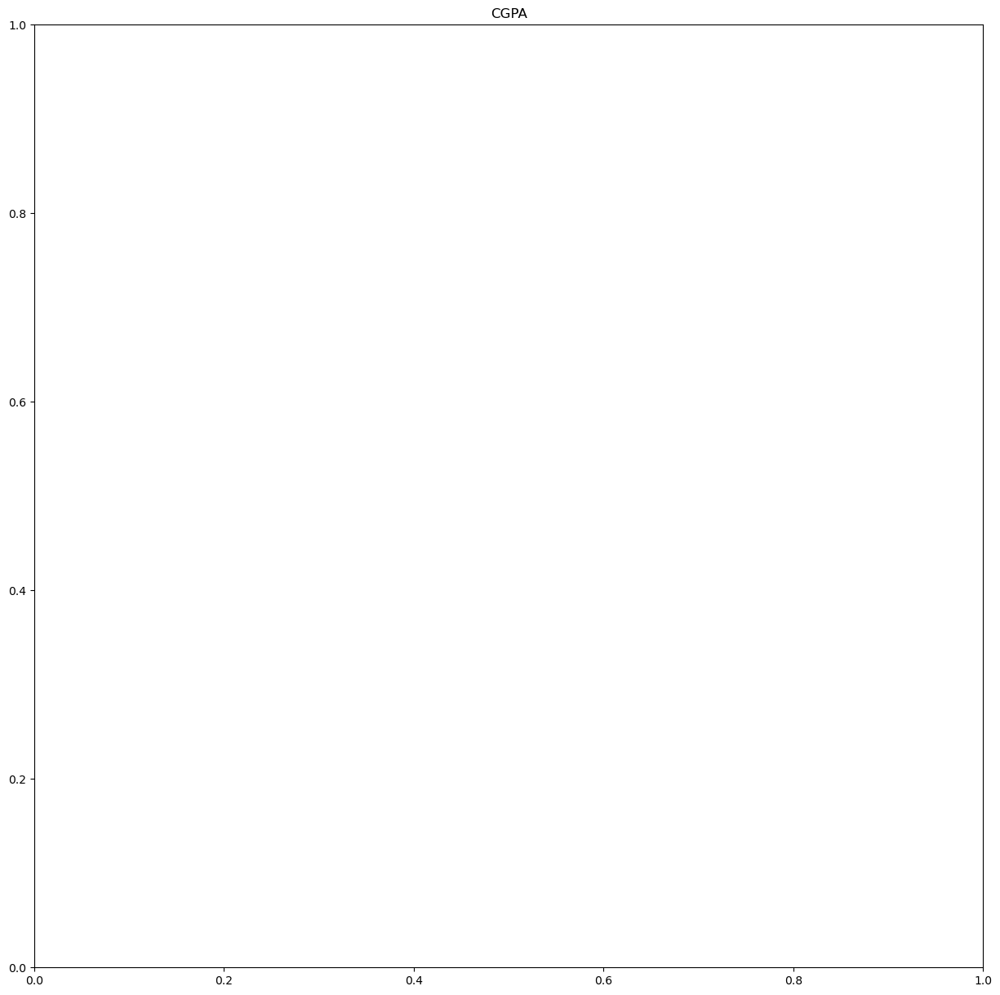

In [186]:
# Applying scatterplot,barplot so that the linear relationship between the target and independent variable becomes evident..
for column in grades:
    plt.figure(column, figsize = (15,15))
    plt.title(column)
    if grades[column].dtypes == "object":
        sns.barplot(x = column,y = 'CGPA',data = grades,ci = False)

### Feature Engineering 

In [192]:
#Label Encoding
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
for i in cat_col:
    grades[i] = LabelEncoder().fit_transform(grades[i])

In [193]:
grades

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-318,CS-306,CS-312,CS-317,CS-403,CS-421,CS-414,CS-419,CS-423,CGPA
0,5,10,8,6,8,10,9,8,5,8,...,8,6,8,8,8,8,0,8,3,2.205
1,0,9,10,9,5,6,9,0,10,9,...,2,9,10,9,6,9,5,6,6,2.008
2,0,3,0,5,4,0,5,4,2,2,...,2,2,3,3,0,6,0,0,2,3.608
3,9,7,10,9,9,2,10,8,9,7,...,4,8,10,6,10,8,3,7,7,1.906
4,2,2,2,4,0,0,2,4,0,2,...,5,2,5,4,4,5,0,2,2,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,3,0,0,2,1,0,2,2,1,4,...,0,4,2,2,0,0,4,4,3,3.798
567,1,0,0,0,0,0,0,2,0,0,...,1,2,4,4,0,0,3,2,6,3.772
568,3,0,2,4,0,0,0,0,0,3,...,7,4,2,3,0,4,6,4,2,3.470
569,0,4,9,0,9,10,5,8,5,8,...,5,4,9,3,3,8,6,3,5,2.193


In [203]:
grades.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 563 entries, 0 to 570
Data columns (total 40 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PH-121     563 non-null    int32  
 1   HS-101     563 non-null    int32  
 2   CY-105     563 non-null    int32  
 3   HS-105/12  563 non-null    int32  
 4   MT-111     563 non-null    int32  
 5   CS-105     563 non-null    int32  
 6   CS-106     563 non-null    int32  
 7   EL-102     563 non-null    int32  
 8   EE-119     563 non-null    int32  
 9   ME-107     563 non-null    int32  
 10  CS-107     563 non-null    int32  
 11  HS-205/20  563 non-null    int32  
 12  MT-222     563 non-null    int32  
 13  EE-222     563 non-null    int32  
 14  MT-224     563 non-null    int32  
 15  CS-210     563 non-null    int32  
 16  CS-211     563 non-null    int32  
 17  CS-203     563 non-null    int32  
 18  CS-214     563 non-null    int32  
 19  EE-217     563 non-null    int32  
 20  CS-212    

PH-121          Axes(0.125,0.747241;0.0731132x0.132759)
HS-101       Axes(0.212736,0.747241;0.0731132x0.132759)
CY-105       Axes(0.300472,0.747241;0.0731132x0.132759)
HS-105/12    Axes(0.388208,0.747241;0.0731132x0.132759)
MT-111       Axes(0.475943,0.747241;0.0731132x0.132759)
CS-105       Axes(0.563679,0.747241;0.0731132x0.132759)
CS-106       Axes(0.651415,0.747241;0.0731132x0.132759)
EL-102       Axes(0.739151,0.747241;0.0731132x0.132759)
EE-119       Axes(0.826887,0.747241;0.0731132x0.132759)
ME-107          Axes(0.125,0.587931;0.0731132x0.132759)
CS-107       Axes(0.212736,0.587931;0.0731132x0.132759)
HS-205/20    Axes(0.300472,0.587931;0.0731132x0.132759)
MT-222       Axes(0.388208,0.587931;0.0731132x0.132759)
EE-222       Axes(0.475943,0.587931;0.0731132x0.132759)
MT-224       Axes(0.563679,0.587931;0.0731132x0.132759)
CS-210       Axes(0.651415,0.587931;0.0731132x0.132759)
CS-211       Axes(0.739151,0.587931;0.0731132x0.132759)
CS-203       Axes(0.826887,0.587931;0.0731132x0.

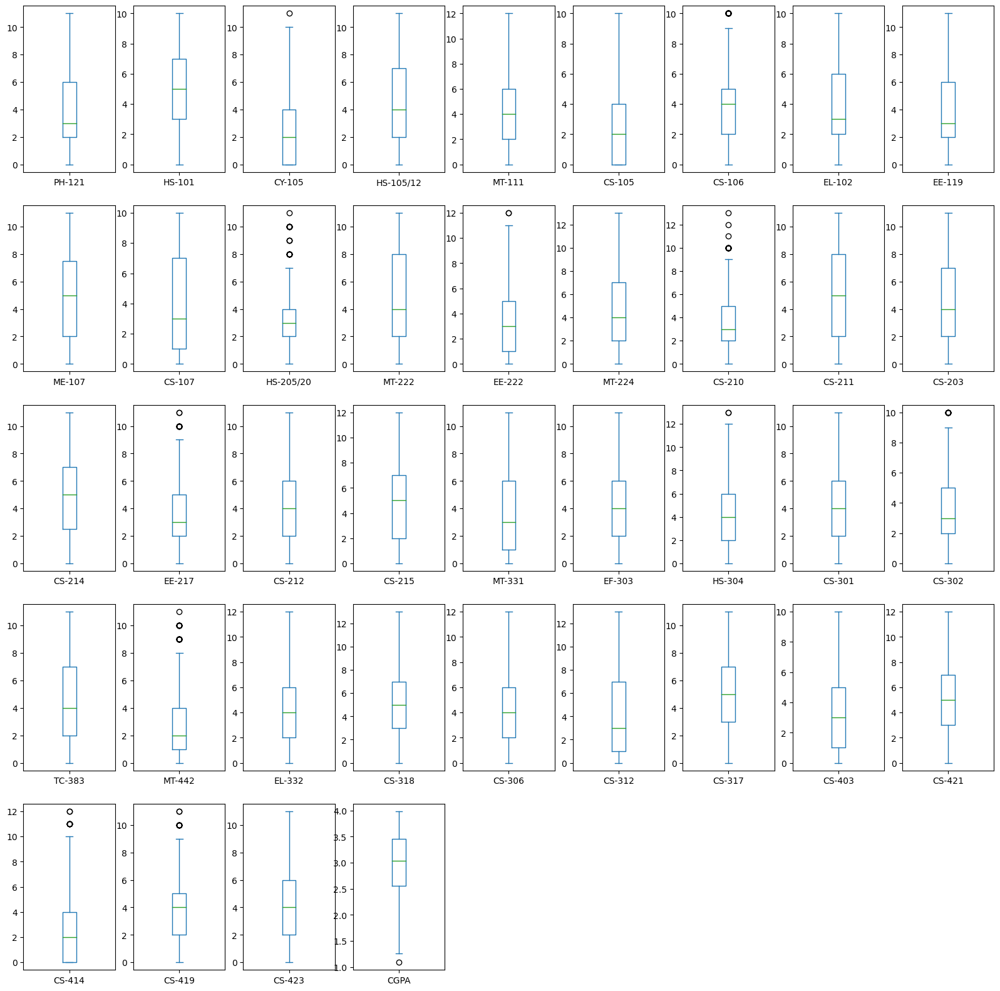

In [199]:
#Detecting outliers
grades.plot(kind='box',subplots=True,layout=(5,9),figsize=(20,20))

-- As we can see there are some outliers present in the dataset,not many but we shall move on with the analysis..

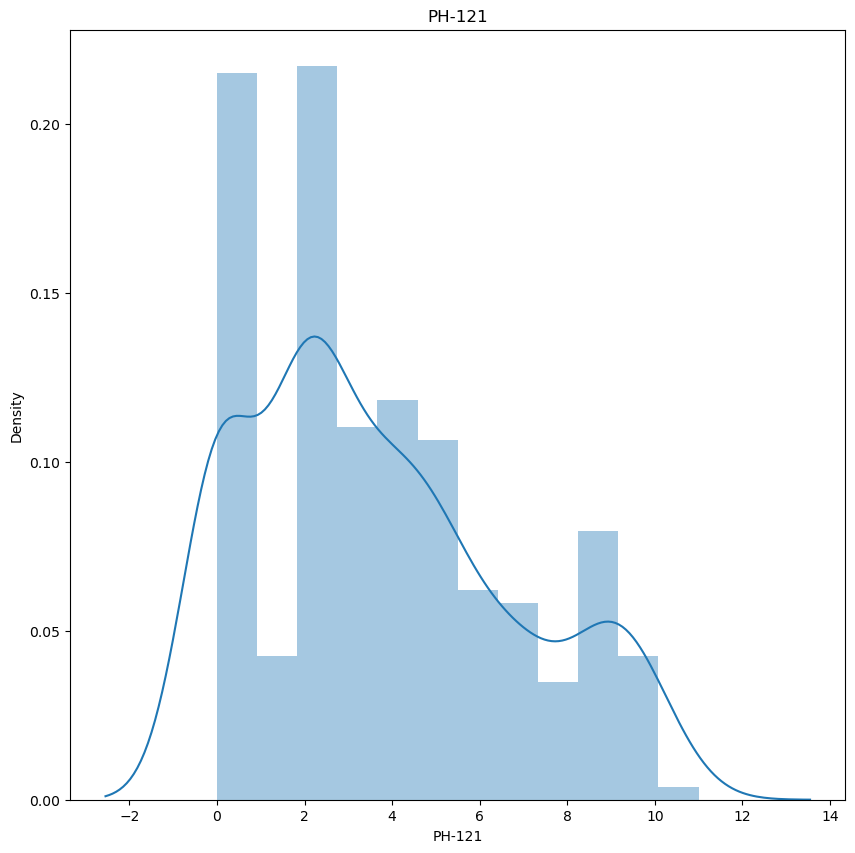

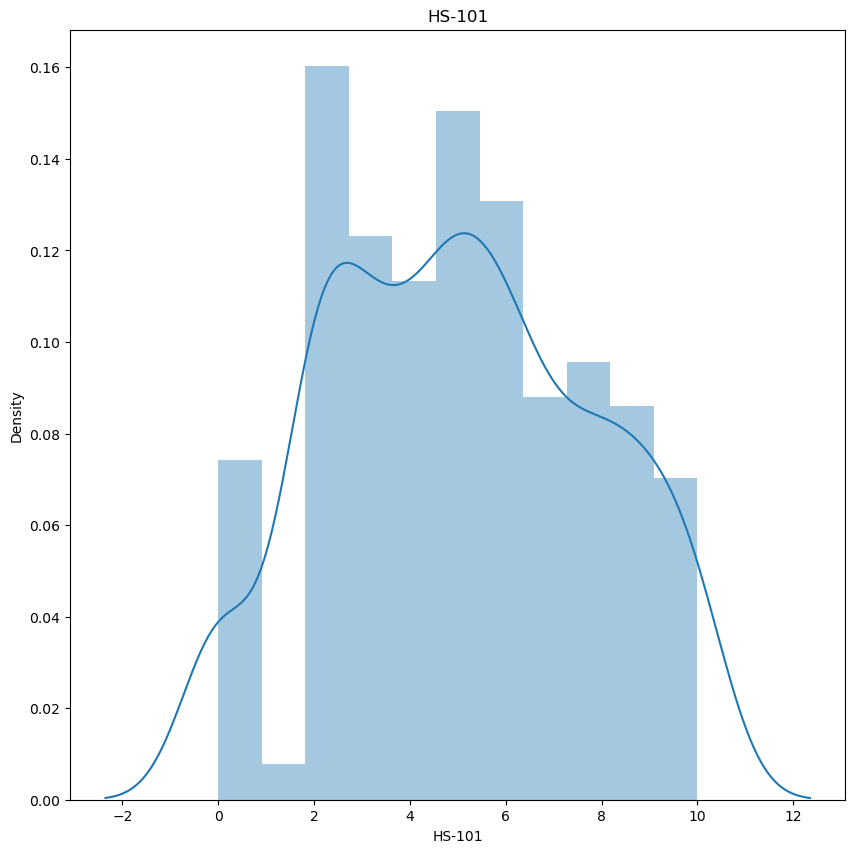

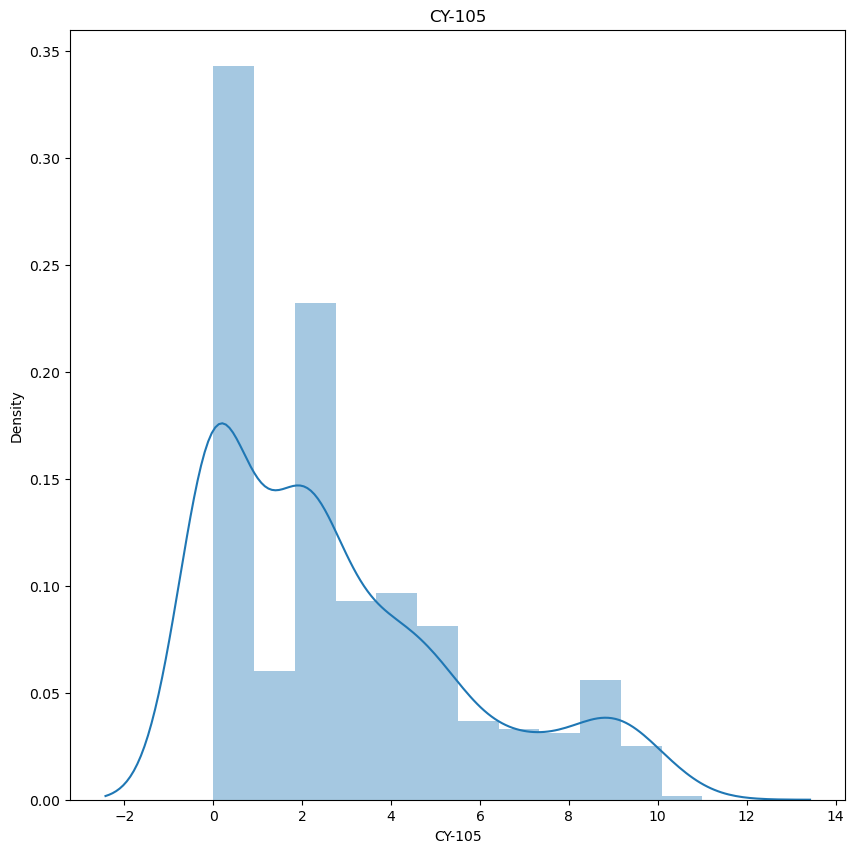

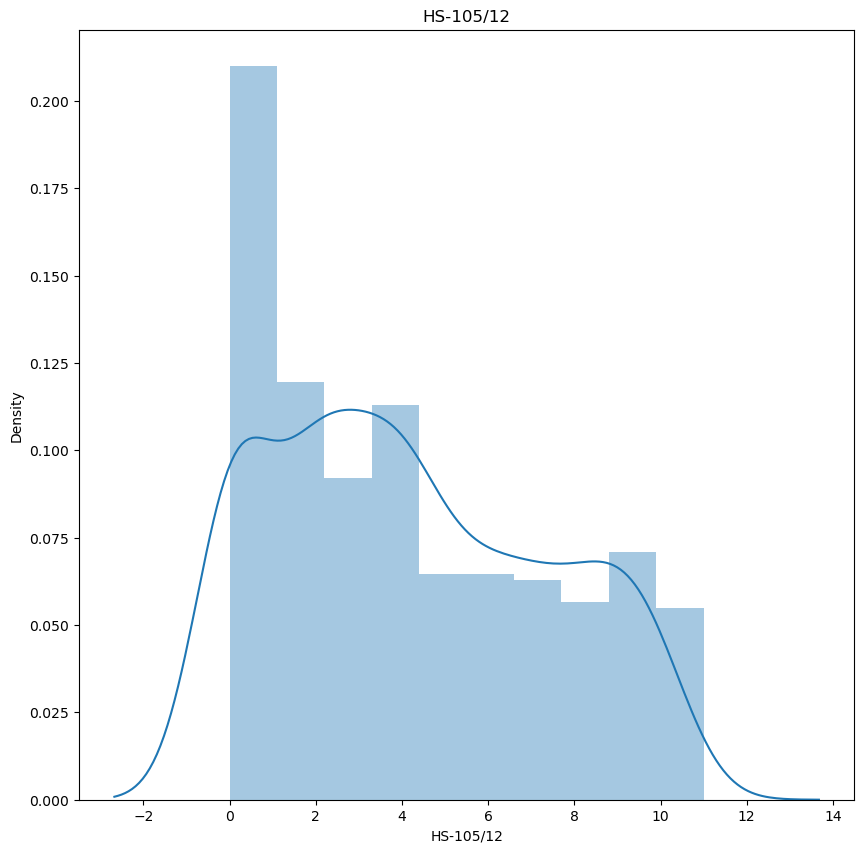

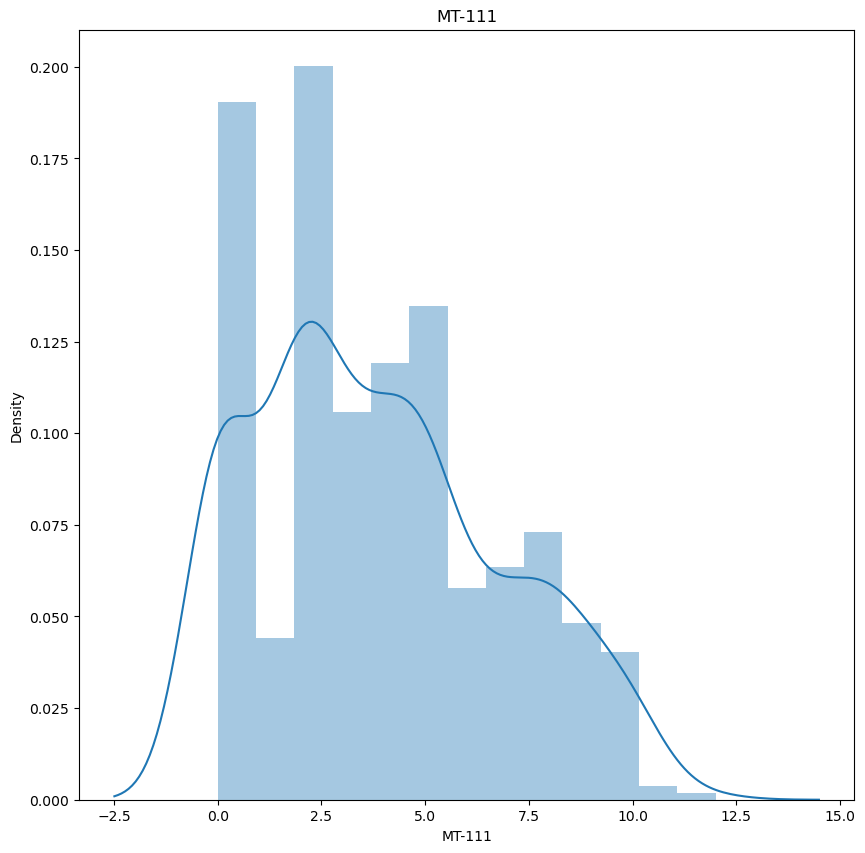

...

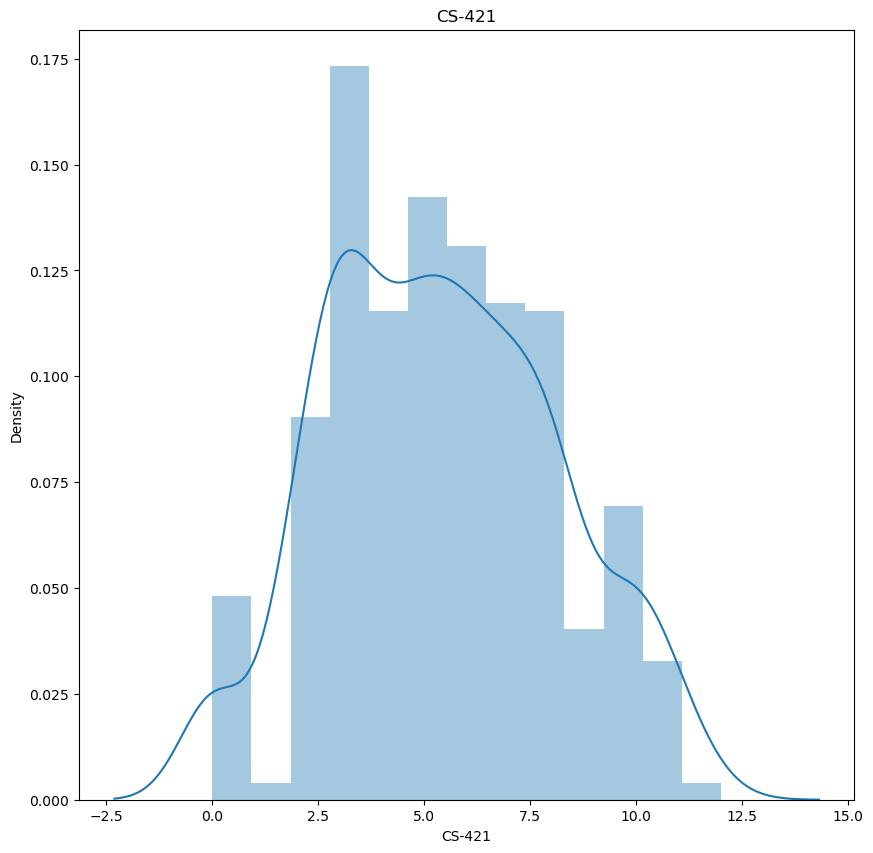

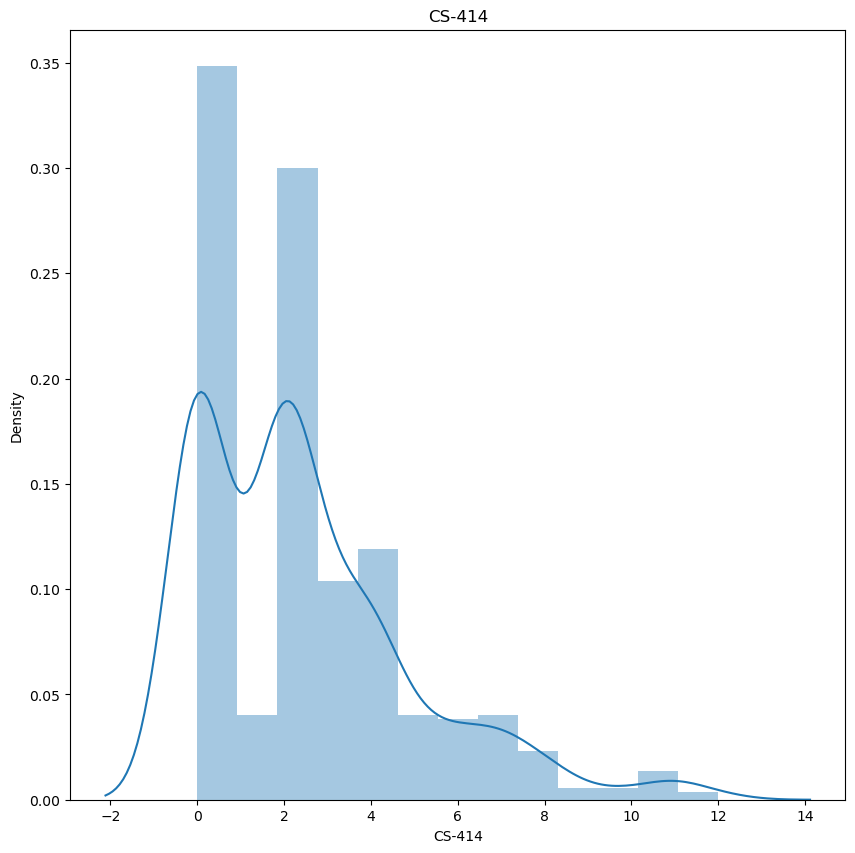

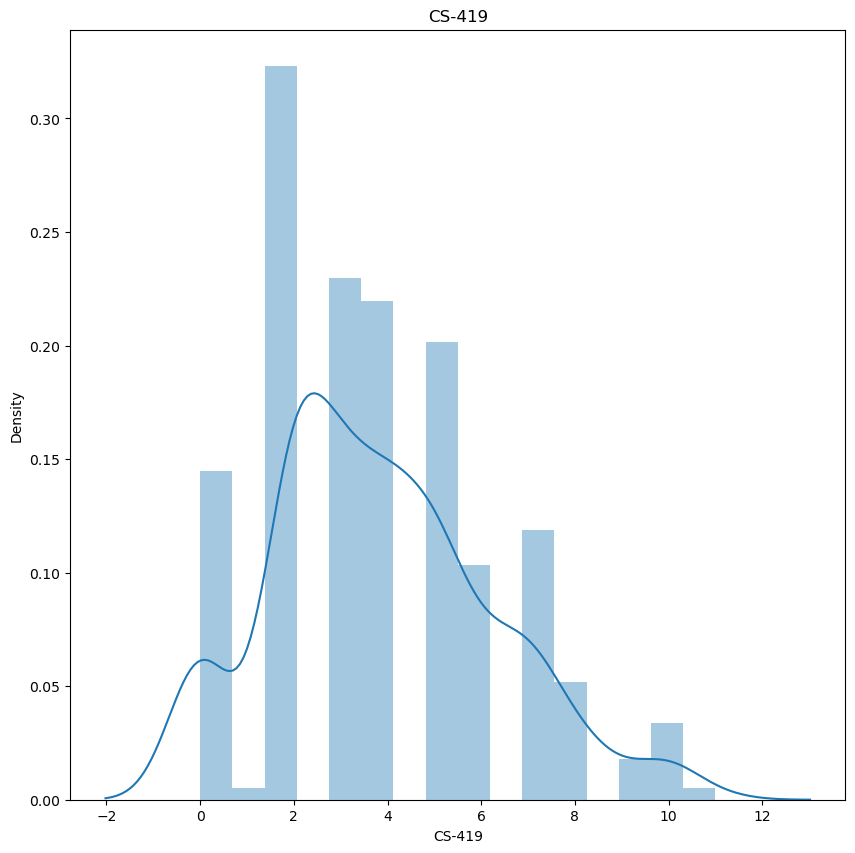

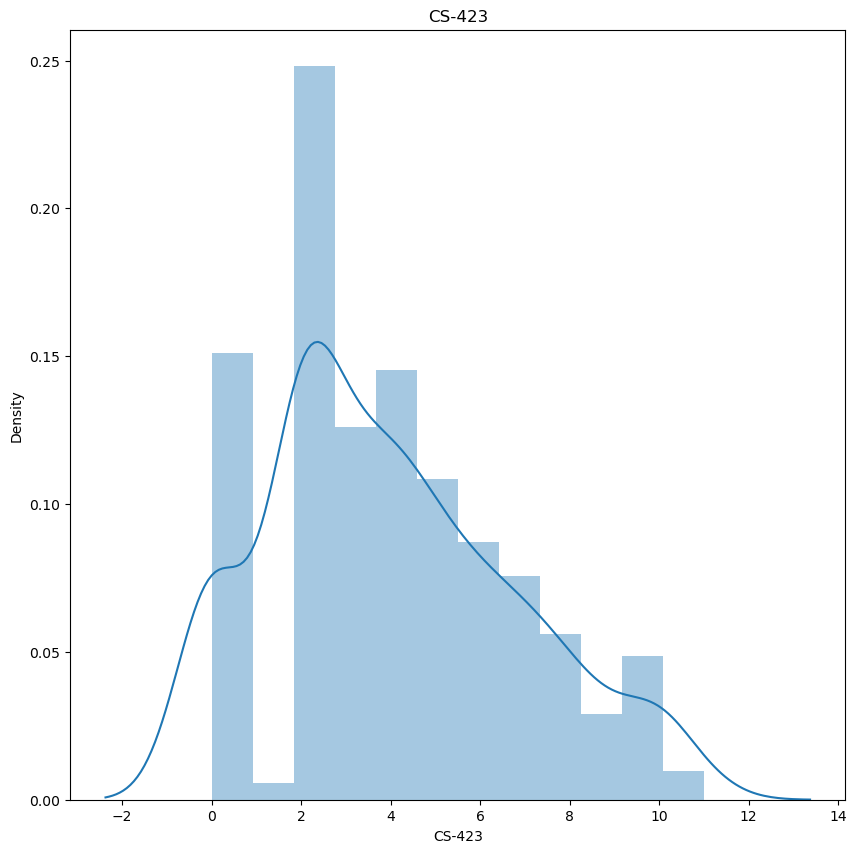

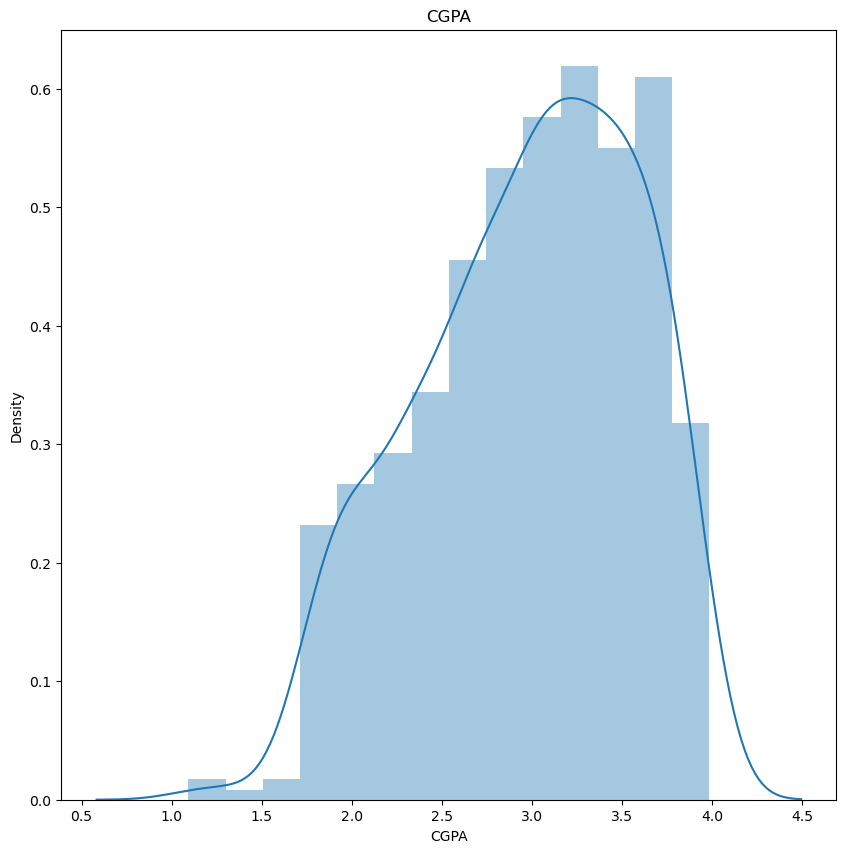

In [202]:
for column in grades:
    plt.figure(column, figsize = (10,10))
    plt.title(column)
    if grades[column].dtypes != "object":
        sns.distplot(grades[column])

In [201]:
grades.skew()

PH-121       0.557528
HS-101       0.060246
CY-105       0.950616
HS-105/12    0.315225
MT-111       0.457595
CS-105       0.945297
CS-106       0.607275
EL-102       0.460663
EE-119       0.558851
ME-107       0.086209
CS-107       0.376889
HS-205/20    0.804975
MT-222       0.163612
EE-222       0.751236
MT-224       0.407512
CS-210       0.708538
CS-211       0.079936
CS-203       0.250924
CS-214       0.013330
EE-217       0.689177
CS-212       0.405381
CS-215       0.130048
MT-331       0.613502
EF-303       0.360156
HS-304       0.523169
CS-301       0.391037
CS-302       0.579549
TC-383       0.316920
MT-442       0.851100
EL-332       0.442076
CS-318       0.338352
CS-306       0.408241
CS-312       0.422051
CS-317       0.142268
CS-403       0.609649
CS-421       0.153360
CS-414       1.281105
CS-419       0.483257
CS-423       0.503373
CGPA        -0.397458
dtype: float64

-- No skewness in any of the features..

#### Correlation Analysis 

In [204]:
grades_cor = grades.corr()
grades_cor

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-318,CS-306,CS-312,CS-317,CS-403,CS-421,CS-414,CS-419,CS-423,CGPA
PH-121,1.000000,0.371729,0.552251,0.497165,0.469837,0.598639,0.279173,0.416856,0.585434,0.533795,...,0.472766,0.498167,0.056647,0.471853,0.353812,0.316374,0.177009,0.490552,0.112154,-0.651468
HS-101,0.371729,1.000000,0.327022,0.471290,0.435899,0.389952,0.306504,0.351313,0.310164,0.334257,...,0.418446,0.443478,0.223022,0.366503,0.242535,0.315283,0.239481,0.296441,0.238187,-0.530595
CY-105,0.552251,0.327022,1.000000,0.487164,0.530250,0.577040,0.347679,0.430151,0.491939,0.471388,...,0.353464,0.391461,0.286639,0.489775,0.507450,0.390152,0.035618,0.470967,0.145587,-0.656314
HS-105/12,0.497165,0.471290,0.487164,1.000000,0.483998,0.482569,0.483221,0.348833,0.416797,0.320913,...,0.390898,0.502050,0.275640,0.487152,0.474194,0.438724,0.160220,0.487446,0.250410,-0.620983
MT-111,0.469837,0.435899,0.530250,0.483998,1.000000,0.394493,0.489880,0.549617,0.411703,0.470789,...,0.393564,0.495208,0.493966,0.565807,0.438293,0.533160,0.244107,0.522429,0.417051,-0.750895
CS-105,0.598639,0.389952,0.577040,0.482569,0.394493,1.000000,0.276786,0.354140,0.505124,0.449230,...,0.472523,0.440747,0.074641,0.394474,0.306042,0.259267,0.143690,0.329402,0.059674,-0.593253
CS-106,0.279173,0.306504,0.347679,0.483221,0.489880,0.276786,1.000000,0.316862,0.282257,0.286861,...,0.264763,0.363695,0.485098,0.426022,0.465411,0.425356,0.129861,0.448685,0.362555,-0.536100
EL-102,0.416856,0.351313,0.430151,0.348833,0.549617,0.354140,0.316862,1.000000,0.460027,0.466882,...,0.370655,0.439551,0.330252,0.478315,0.338778,0.398388,0.269413,0.406761,0.394504,-0.656975
EE-119,0.585434,0.310164,0.491939,0.416797,0.411703,0.505124,0.282257,0.460027,1.000000,0.565168,...,0.390141,0.434004,0.169329,0.451907,0.361221,0.371376,0.224027,0.479208,0.252982,-0.654858
ME-107,0.533795,0.334257,0.471388,0.320913,0.470789,0.449230,0.286861,0.466882,0.565168,1.000000,...,0.384977,0.414524,0.208273,0.469674,0.352099,0.363563,0.168788,0.458652,0.233513,-0.666943


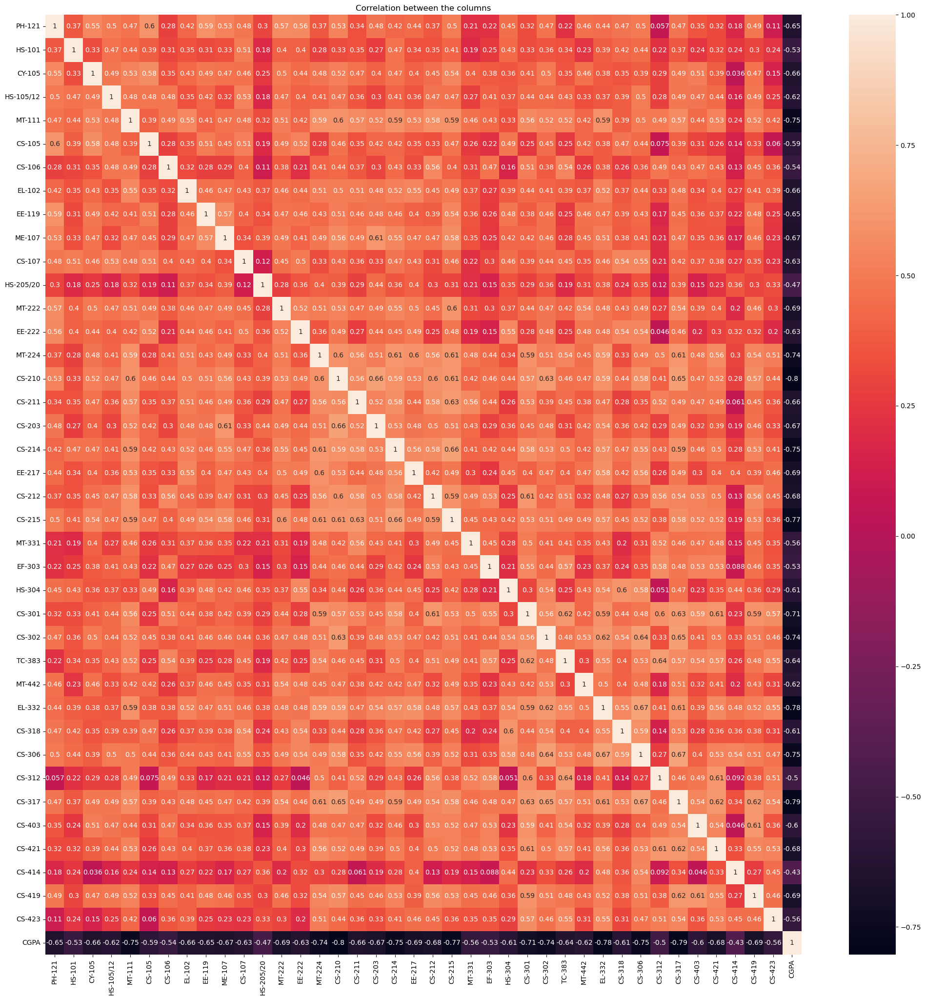

In [211]:
plt.figure(figsize=(25,25))
sns.heatmap(grades_cor, annot = True)
plt.title("Correlation between the columns")
plt.show()

## Data Preprocessing 

In [212]:
grades

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-318,CS-306,CS-312,CS-317,CS-403,CS-421,CS-414,CS-419,CS-423,CGPA
0,5,10,8,6,8,10,9,8,5,8,...,8,6,8,8,8,8,0,8,3,2.205
1,0,9,10,9,5,6,9,0,10,9,...,2,9,10,9,6,9,5,6,6,2.008
2,0,3,0,5,4,0,5,4,2,2,...,2,2,3,3,0,6,0,0,2,3.608
3,9,7,10,9,9,2,10,8,9,7,...,4,8,10,6,10,8,3,7,7,1.906
4,2,2,2,4,0,0,2,4,0,2,...,5,2,5,4,4,5,0,2,2,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,3,0,0,2,1,0,2,2,1,4,...,0,4,2,2,0,0,4,4,3,3.798
567,1,0,0,0,0,0,0,2,0,0,...,1,2,4,4,0,0,3,2,6,3.772
568,3,0,2,4,0,0,0,0,0,3,...,7,4,2,3,0,4,6,4,2,3.470
569,0,4,9,0,9,10,5,8,5,8,...,5,4,9,3,3,8,6,3,5,2.193


In [213]:
y = grades['CGPA']
y

0      2.205
1      2.008
2      3.608
3      1.906
4      3.448
       ...  
566    3.798
567    3.772
568    3.470
569    2.193
570    1.753
Name: CGPA, Length: 563, dtype: float64

In [214]:
x = grades.drop("CGPA",axis=1)
x

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,EL-332,CS-318,CS-306,CS-312,CS-317,CS-403,CS-421,CS-414,CS-419,CS-423
0,5,10,8,6,8,10,9,8,5,8,...,6,8,6,8,8,8,8,0,8,3
1,0,9,10,9,5,6,9,0,10,9,...,6,2,9,10,9,6,9,5,6,6
2,0,3,0,5,4,0,5,4,2,2,...,4,2,2,3,3,0,6,0,0,2
3,9,7,10,9,9,2,10,8,9,7,...,10,4,8,10,6,10,8,3,7,7
4,2,2,2,4,0,0,2,4,0,2,...,2,5,2,5,4,4,5,0,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,3,0,0,2,1,0,2,2,1,4,...,0,0,4,2,2,0,0,4,4,3
567,1,0,0,0,0,0,0,2,0,0,...,0,1,2,4,4,0,0,3,2,6
568,3,0,2,4,0,0,0,0,0,3,...,3,7,4,2,3,0,4,6,4,2
569,0,4,9,0,9,10,5,8,5,8,...,9,5,4,9,3,3,8,6,3,5


In [215]:
#Using standard scaler 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = sc.fit_transform(x)

In [218]:
X

array([[ 0.42650096,  1.78284036,  1.80710356, ..., -0.97328746,
         1.72474248, -0.3548756 ],
       [-1.23638022,  1.42320614,  2.50490829, ...,  1.02803044,
         0.88692538,  0.71545457],
       [-1.23638022, -0.73459922, -0.98411538, ..., -0.97328746,
        -1.62652591, -0.71165233],
       ...,
       [-0.23865151, -1.81350189, -0.28631065, ...,  1.42829402,
         0.04910828, -0.71165233],
       [-1.23638022, -0.37496499,  2.15600593, ...,  1.42829402,
        -0.36980027,  0.35867784],
       [ 0.7590772 ,  1.42320614,  2.15600593, ...,  2.22882117,
         0.04910828,  1.78578474]])

In [217]:
pd.DataFrame(X)

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
0,0.426501,1.782840,1.807104,0.570559,1.401809,2.712306,1.840300,1.380603,0.428163,1.045742,...,0.636009,1.043291,0.654466,1.163823,1.148576,1.529293,0.945006,-0.973287,1.724742,-0.354876
1,-1.236380,1.423206,2.504908,1.519992,0.383900,1.207845,1.840300,-1.314775,2.326241,1.366938,...,0.636009,-0.987969,1.703226,1.760302,1.511250,0.854799,1.311172,1.028030,0.886925,0.715455
2,-1.236380,-0.734599,-0.984115,0.254081,0.044598,-1.048847,0.345761,0.032914,-0.710684,-0.881436,...,-0.050612,-0.987969,-0.743881,-0.327375,-0.664796,-1.168684,0.212675,-0.973287,-1.626526,-0.711652
3,1.756806,0.703938,2.504908,1.519992,1.741112,-0.296617,2.213935,1.380603,1.946626,0.724546,...,2.009252,-0.310883,1.353639,1.760302,0.423227,2.203788,0.945006,0.227503,1.305834,1.072231
4,-0.571228,-1.094233,-0.286311,-0.062396,-1.312614,-1.048847,-0.775143,0.032914,-1.469915,-0.881436,...,-0.737234,0.027661,-0.743881,0.269104,-0.302121,0.180304,-0.153490,-0.973287,-0.788709,-0.711652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
558,-0.238652,-1.813502,-0.984115,-0.695351,-0.973311,-1.048847,-0.775143,-0.640930,-1.090299,-0.239043,...,-1.423855,-1.665056,-0.044707,-0.625614,-1.027470,-1.168684,-1.984318,0.627767,0.049108,-0.354876
559,-0.903804,-1.813502,-0.984115,-1.328306,-1.312614,-1.048847,-1.522412,-0.640930,-1.469915,-1.523828,...,-1.423855,-1.326513,-0.743881,-0.029135,-0.302121,-1.168684,-1.984318,0.227503,-0.788709,0.715455
560,-0.238652,-1.813502,-0.286311,-0.062396,-1.312614,-1.048847,-1.522412,-1.314775,-1.469915,-0.560239,...,-0.393923,0.704748,-0.044707,-0.625614,-0.664796,-1.168684,-0.519656,1.428294,0.049108,-0.711652
561,-1.236380,-0.374965,2.156006,-1.328306,1.741112,2.712306,0.345761,1.380603,0.428163,1.045742,...,1.665941,0.027661,-0.044707,1.462062,-0.664796,-0.156943,0.945006,1.428294,-0.369800,0.358678


In [219]:
# Now, Splitting the data into training and test dataset
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.30)

In [220]:
print("X_train ",X_train.shape)
print("y_train ",y_train.shape)
print("X_test ",X_test.shape)
print("y_test ",y_test.shape)

X_train  (394, 39)
y_train  (394,)
X_test  (169, 39)
y_test  (169,)


## Model Training 

-- As this is a Regression problem, we shall predict values using all the models which fall under regression... such as Linear Regression,Decision Tree Regressor,Random Forest Regressor,Lasso and Ridge..

#### Linear Regression 

In [221]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [222]:
LR = LinearRegression()
LR.fit(X_train,y_train)
LR_pred = LR.predict(X_test)
pred_train = LR.predict(X_train)
print('R2_score:',r2_score(y_test,LR_pred))
print('Mean Absolute Error:',mean_absolute_error(y_test,LR_pred))
print('Mean Squared Error:',mean_squared_error(y_test,LR_pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,LR_pred)))

R2_score: 0.9753683803770837
Mean Absolute Error: 0.06693992013022904
Mean Squared Error: 0.007862583789656812
Root Mean Squared Error: 0.08867121172994542


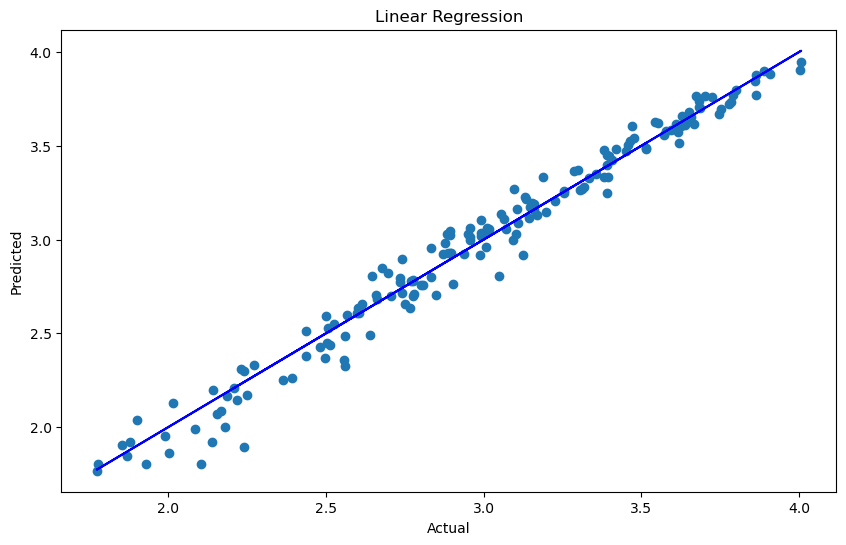

In [223]:
#Scatter Plot
plt.figure(figsize=(10,6))
plt.scatter(x=LR_pred,y=y_test)
plt.plot(LR_pred,LR_pred,color = 'b')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Linear Regression')
plt.show()

#### Decision Tree Regressor 

In [224]:
from sklearn.tree import DecisionTreeRegressor

In [225]:
dtr = DecisionTreeRegressor()
dtr.fit(X_train,y_train)
dtr_pred = dtr.predict(X_test)
pred_train = dtr.predict(X_train)
print('R2_score:',r2_score(y_test,dtr_pred))
print('Mean Absolute Error:',mean_absolute_error(y_test,dtr_pred))
print('Mean Squared Error:',mean_squared_error(y_test,dtr_pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,dtr_pred)))

R2_score: 0.8092789390132895
Mean Absolute Error: 0.1973431952662722
Mean Squared Error: 0.06087948520710058
Root Mean Squared Error: 0.2467376850160927


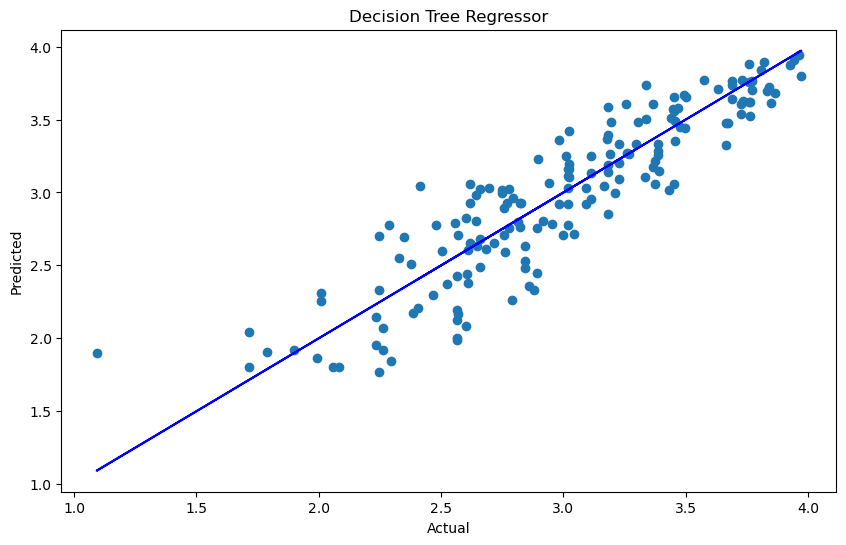

In [226]:
#Scatter Plot
plt.figure(figsize=(10,6))
plt.scatter(x=dtr_pred,y=y_test)
plt.plot(dtr_pred,dtr_pred,color = 'b')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Decision Tree Regressor')
plt.show()

#### Random Forest Regressor 

In [227]:
from sklearn.ensemble import RandomForestRegressor

In [228]:
rfr = RandomForestRegressor()
rfr.fit(X_train,y_train)
rfr_pred = rfr.predict(X_test)
print('R2_score:',r2_score(y_test,rfr_pred))
print('Mean Absolute Error:',mean_absolute_error(y_test,rfr_pred))
print('Mean Squared Error:',mean_squared_error(y_test,rfr_pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,rfr_pred)))

R2_score: 0.927264065637274
Mean Absolute Error: 0.11216704142011812
Mean Squared Error: 0.023217814630177466
Root Mean Squared Error: 0.15237393028394808


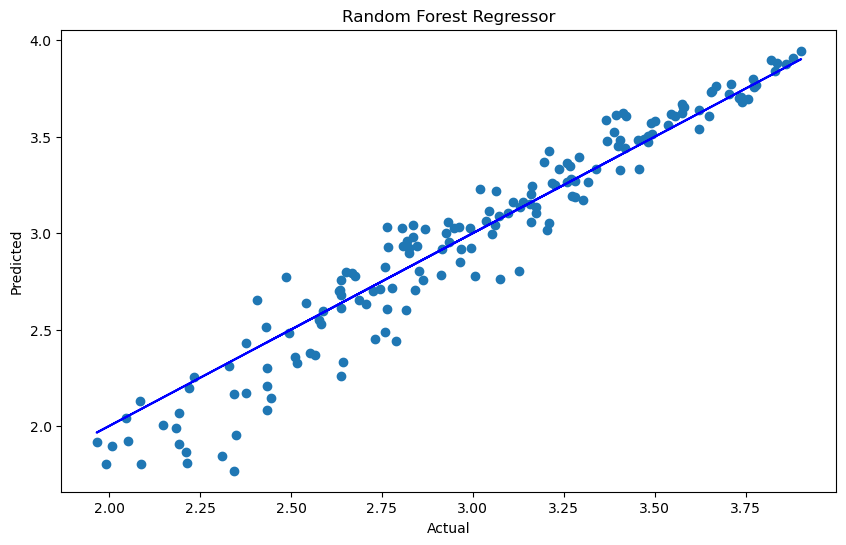

In [229]:
#Scatter Plot
plt.figure(figsize=(10,6))
plt.scatter(x=rfr_pred,y=y_test)
plt.plot(rfr_pred,rfr_pred,color = 'b')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Random Forest Regressor')
plt.show()

#### Lasso and Ridge Regressor 

In [230]:
from sklearn.linear_model import Lasso,Ridge

In [231]:
l = Lasso()
l.fit(X_train,y_train)
l_pred = l.predict(X_test)
print('R2_score:',r2_score(y_test,l_pred))
print('Mean Absolute Error:',mean_absolute_error(y_test,l_pred))
print('Mean Squared Error:',mean_squared_error(y_test,l_pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,l_pred)))

R2_score: -0.0003343702273956861
Mean Absolute Error: 0.4675432072808098
Mean Squared Error: 0.31931366771631237
Root Mean Squared Error: 0.5650784615576074


In [232]:
r = Ridge()
r.fit(X_train,y_train)
r_pred = r.predict(X_test)
print('R2_score:',r2_score(y_test,r_pred))
print('Mean Absolute Error:',mean_absolute_error(y_test,r_pred))
print('Mean Squared Error:',mean_squared_error(y_test,r_pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,r_pred)))

R2_score: 0.9754642401065553
Mean Absolute Error: 0.06677213111653053
Mean Squared Error: 0.007831984699277764
Root Mean Squared Error: 0.08849850111317008


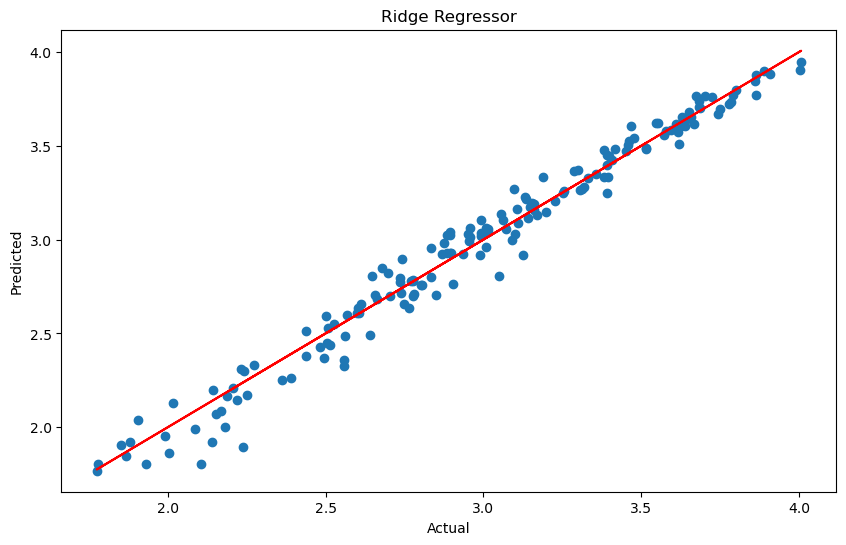

In [233]:
plt.figure(figsize=(10,6))
plt.scatter(x=r_pred,y=y_test)
plt.plot(r_pred,r_pred,color = 'r')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Ridge Regressor')
plt.show()

#### Cross Validation score 

In [234]:
from sklearn.model_selection import cross_val_score

In [235]:
score = cross_val_score(LR,X,y,scoring = 'r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,LR_pred) - score.mean())*100)

[0.96937016 0.98962826 0.96023197 0.98016733 0.96492634]
0.9728648129619948
Difference between R2 score and cross validation score is -  0.25035674150889475


In [236]:
score = cross_val_score(dtr,X,y,scoring = 'r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,dtr_pred) - score.mean())*100)

[0.85597428 0.85397125 0.84350323 0.78575588 0.81015207]
0.8298713427262715
Difference between R2 score and cross validation score is -  -2.059240371298199


In [237]:
score = cross_val_score(rfr,X,y,scoring = 'r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,rfr_pred) - score.mean())*100)

[0.9484962  0.95053998 0.94361089 0.9410593  0.9238212 ]
0.9415055122866146
Difference between R2 score and cross validation score is -  -1.4241446649340572


In [238]:
score = cross_val_score(l,X,y,scoring = 'r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,l_pred) - score.mean())*100)

[-0.006468   -0.00525741 -0.00294441 -0.00075716 -0.03419188]
-0.00992377115151961
Difference between R2 score and cross validation score is -  0.9589400924123924


In [239]:
score = cross_val_score(r,X,y,scoring = 'r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is - ",(r2_score(y_test,r_pred) - score.mean())*100)

[0.96938689 0.98966653 0.96024292 0.98024904 0.96502066]
0.972913207539527
Difference between R2 score and cross validation score is -  0.25510325670282663


As the difference between Cross val score and r2 score is less for Linear regression..We are going to choose Linear Regression as our final model for our prediction of CGPA scores...

## Saving the Model 

In [241]:
import joblib
joblib.dump(LR,"Student_Grade_Prediction_Project.pkl")

['Student_Grade_Prediction_Project.pkl']

In [242]:
model = joblib.load("Student_Grade_Prediction_Project.pkl")
prediction = model.predict(X_test)
prediction

array([3.51547423, 2.95562477, 3.39807373, 2.52439357, 3.68349338,
       3.5785314 , 3.00846204, 2.56013261, 1.98968616, 2.49579881,
       2.5002954 , 3.77707098, 3.46875648, 2.23897629, 1.77796697,
       3.59279156, 2.36333285, 3.2987949 , 3.79146286, 2.77857989,
       2.59894117, 2.73971621, 3.05557452, 3.6821744 , 2.870034  ,
       3.14236987, 3.63720194, 2.74950442, 2.87609002, 3.14612914,
       2.2506581 , 3.57205477, 3.70075108, 2.43809576, 3.6571119 ,
       2.61291582, 2.00337914, 3.90788668, 3.3827209 , 2.17989559,
       2.95000332, 3.40792749, 2.10405778, 2.83475934, 3.22742816,
       3.39215036, 2.66184644, 2.99184054, 2.70577287, 3.19714877,
       3.00978359, 2.21869221, 3.45880641, 2.8069792 , 3.05008589,
       2.50321755, 2.89213591, 4.00317394, 3.15428527, 3.17032541,
       3.74457209, 2.18812044, 2.39141008, 3.12994109, 3.62568982,
       3.64525959, 2.73470003, 3.10166598, 3.62963652, 1.93051762,
       3.31943756, 3.0161883 , 3.09241723, 2.89601629, 3.51558

In [244]:
b

array([3.481, 2.995, 3.443, 2.548, 3.707, 3.58 , 2.96 , 2.328, 1.951,
       2.37 , 2.595, 3.721, 3.607, 1.896, 1.805, 3.586, 2.253, 3.369,
       3.772, 2.711, 2.611, 2.715, 3.137, 3.737, 2.925, 3.114, 3.608,
       2.654, 2.982, 3.174, 2.171, 3.559, 3.765, 2.378, 3.653, 2.655,
       1.863, 3.882, 3.334, 2.003, 3.029, 3.424, 1.806, 2.8  , 3.205,
       3.248, 2.681, 3.019, 2.698, 3.149, 3.06 , 2.146, 3.504, 2.756,
       2.805, 2.451, 2.928, 3.906, 3.195, 3.133, 3.668, 2.165, 2.26 ,
       3.229, 3.605, 3.641, 2.793, 3.03 , 3.656, 1.804, 3.281, 3.055,
       2.999, 2.931, 3.49 , 3.363, 3.523, 2.806, 2.918, 2.429, 3.843,
       2.311, 3.027, 2.3  , 2.084, 3.247, 2.931, 3.266, 3.107, 3.759,
       3.769, 2.706, 3.483, 2.895, 3.798, 3.058, 2.44 , 2.922, 3.164,
       3.267, 2.634, 3.014, 2.918, 3.189, 3.572, 2.599, 3.621, 2.608,
       3.026, 3.106, 3.765, 3.335, 2.528, 2.128, 2.956, 3.473, 3.624,
       3.16 , 2.359, 1.905, 2.636, 2.822, 3.476, 2.699, 2.705, 3.271,
       2.756, 3.328,

In [243]:
b = np.array(y_test)
df = pd.DataFrame()
df['Predicted'] = prediction
df['Original'] = b
df

,Predicted,Original
0,3.515474,3.481
1,2.955625,2.995
2,3.398074,3.443
3,2.524394,2.548
4,3.683493,3.707
...,...,...
164,2.893250,3.043
165,2.903961,2.763
166,3.665798,3.618
167,3.686296,3.700


Text(0.5, 1.0, 'Actual vs Predicted values')

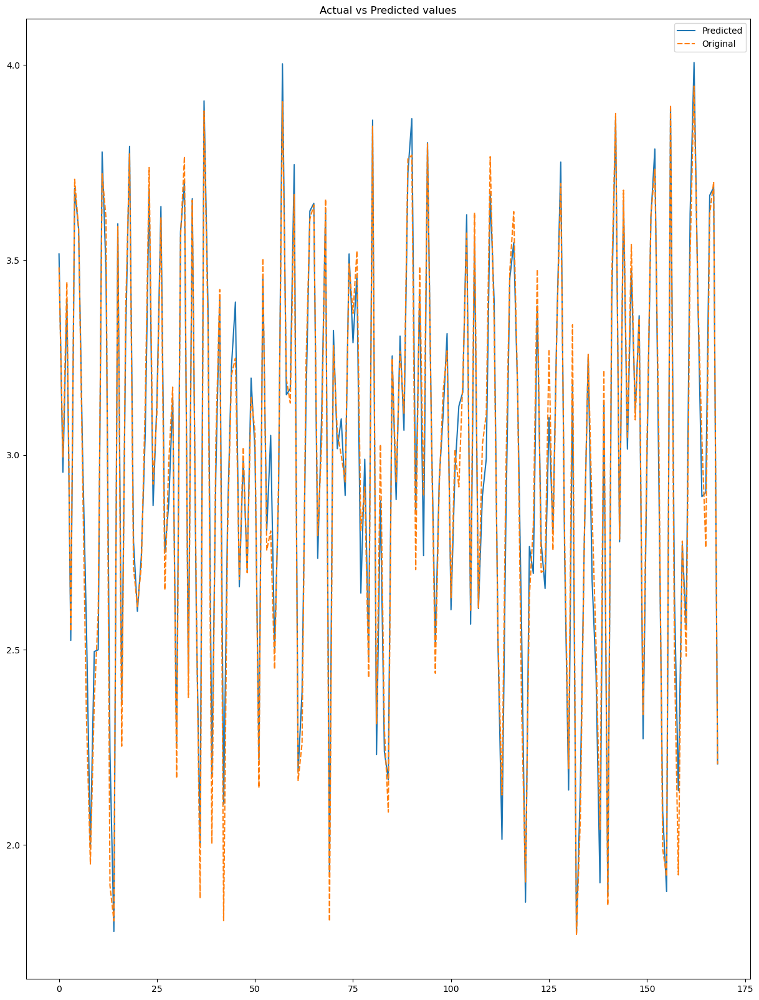

In [245]:
#Visually representing the actual vs predicted values..
plt.figure(figsize=(15,20))
sns.lineplot(data=df)
plt.title('Actual vs Predicted values')